<a href="https://colab.research.google.com/github/snehasisn1996/Taxi-Demand-Prediction/blob/main/CA683_Assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

- Phase 1 : Inital Exploration and Data Analysis
  - Install and upgrade packages
  - Load CSV files as Dask Dataframe
  - Data Dictionary
  - Parse dates: map_partitions
  - Erroneous Dates
  - Save dataframe as parquet
  
  Phase 2: EDA: Analysing Locations and Time Interval
  - Load Parquet from disk
  - Time interval of partitions
  - Number of trips by Boroughs
  - Trips in Manhattan
  - Number of trips by pickup location
  
  Phase 3: Data Cleaning Feature Engineering
  - Remove exteme outliers
  - Passenger count
  - Trip distance and fares
  - Duration and Speed
  
  Phase 4: Data Aggregation
  - Downsample time-series grouped by location
  - Aggregate functions: sum, average, count
  - Choose the best frequency of samples--less nulls
  
  Phase 5: Univariate Forecasting: ARIMA
  - Combine 2017 and 2018 data
  - Forward fill zeros
  - Visual inspection of time-series data
  - Augmented Dickey-Fuller test
  - Kwitkowsi-Phillips-Schmidt-Shin Test
  - Partial Auto correlation, Auto correlation plots
  - Grid search ARIMA parameters--lowest AIC
  - Walk forward validation
  
  Phase 6: LSTM networks
  - Preprocess data
  - Vanilla LSTM
  - Scaling data 
  - Diagnose model performance
  - Stacked LSTM
 

# Business Problem

## Phase 1: Inital Exploratory Data Analysis

The yellow and green taxi trip records include fields capturing pick-up and drop-off dates/times, pick-up and drop-off locations, trip distances, itemized fares, rate types, payment types, and driver-reported passenger counts. 

In [ ]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [ ]:
#required for google colab
# mount google drive
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import dask.dataframe as dd
import pickle
from scipy import stats
from dask.diagnostics import ProgressBar
from tabulate import tabulate
import dask.array as da
from dask.distributed import Client,progress
import calendar
import time
# for faster processing
import dask.multiprocessing
#dask.config.set(get=dask.multiprocessing.get)  # set processes as default

# Import the necessaries libraries
import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools

# Set notebook mode to work in offline
pyo.init_notebook_mode()

# tree map
import squarify
# converting int to month abbr
import calendar

# removes warnings when plotting time-series with seaborn
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()


# geographical plotting
import shapefile
from shapely.geometry import Polygon
from descartes.patch import PolygonPatch
import matplotlib as mpl

# # conda install -c conda-forge graphviz
# # conda install -c conda-forge python-graphviz
# conda install -c conda-forge python-snappy 
#conda install -c conda-forge snappy 


# y2017_ddf.visualize()
# can't allocate memory


# enable plotly for google_colab
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))


In [ ]:
dask.config.set(scheduler='multiprocessing')

In [ ]:
# on google colab
c

Client Scheduler: inproc://172.28.0.2/856/1 Dashboard: http://localhost:8787/status,Cluster Workers: 1 Cores: 2 Memory: 13.66 GB


In [ ]:
# on google cloud platform 
c

Client Scheduler: tcp://127.0.0.1:43237 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 4 Cores: 8 Memory: 31.62 GB


In [ ]:
data_types_s = \
{
'VendorID': 'float64',
'tpep_pickup_datetime' :      'object',
'tpep_dropoff_datetime' :     'object',
'passenger_count' :          'float64',
'trip_distance' :           'float64',
'RatecodeID' :               'float64',
'store_and_fwd_flag' :        'object',
'PULocationID' :             'float64',
'DOLocationID' :             'float64',
'payment_type' :             'float64',
'fare_amount' :              'float64',
'extra' :                    'float64',
'mta_tax' :                  'float64',
'tip_amount' :               'float64',
'tolls_amount' :             'float64',
'improvement_surcharge' :    'float64',
'total_amount' :             'float64'
}

The data doesn't fit to memory so I have to load it as a dask dataframe. The dates are stored as strings. I had to parse them into date. Dask dataframe default parser is very slow and takes foreever to complete.

Positional indexing(iloc) and label indexing(loc) is not possible in Dask. Dask doesn't maintain indices or labels of the whole dataframe. It is not as simple as pandas iloc/loc. Trying loc on dask dataframe returns all datapoints from all paritions with the given label. Positional indexing can only be used to select columns, doesn't support row index.

In [ ]:
#blocksize=25e6
y2017_ddf = dd.read_csv('2017_Yellow_Taxi_Trip_Data.csv', dtype=data_types_s)
y2018_ddf = dd.read_csv('2018_Yellow_Taxi_Trip_Data.csv', dtype=data_types_s)

The dask dataframe works on 165 partitions.

In [ ]:
y2017_ddf.npartitions

165

In [ ]:
y2018_ddf.npartitions

92

In [ ]:
# head(n=5, npartitions=1, compute=True)- These are the default arguments
y2017_ddf.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,1.0,05/30/2017 03:34:55 PM,05/30/2017 03:47:48 PM,1.0,1.30,1.0,N,68.0,234.0,2.0,9.0,0.0,0.5,0.00,0.0,0.3,9.80
1,1.0,05/30/2017 03:34:55 PM,05/30/2017 04:04:45 PM,1.0,2.20,1.0,N,186.0,229.0,2.0,18.0,0.0,0.5,0.00,0.0,0.3,18.80
2,2.0,05/30/2017 03:34:55 PM,05/30/2017 03:47:16 PM,1.0,1.13,1.0,N,231.0,125.0,1.0,9.0,0.0,0.5,2.45,0.0,0.3,12.25
3,2.0,05/30/2017 03:34:55 PM,05/30/2017 03:43:40 PM,5.0,1.08,1.0,N,161.0,170.0,2.0,7.0,0.0,0.5,0.00,0.0,0.3,7.80
4,2.0,05/30/2017 03:34:55 PM,05/30/2017 03:55:39 PM,1.0,1.96,1.0,N,239.0,236.0,1.0,14.0,0.0,0.5,2.00,0.0,0.3,16.80


In [ ]:
# head(n=5, npartitions=1, compute=True)- These are the default arguments
y2018_ddf.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2.0,11/04/2084 12:32:24 PM,11/04/2084 12:47:41 PM,1.0,1.34,1.0,N,238.0,236.0,2.0,10.0,0.0,0.5,0.0,0.0,0.3,10.8
1,2.0,11/04/2084 12:32:24 PM,11/04/2084 12:47:41 PM,1.0,1.34,1.0,N,238.0,236.0,2.0,10.0,0.0,0.5,0.0,0.0,0.3,10.8
2,2.0,11/04/2084 12:25:53 PM,11/04/2084 12:29:00 PM,1.0,0.32,1.0,N,238.0,238.0,2.0,4.0,0.0,0.5,0.0,0.0,0.3,4.8
3,2.0,11/04/2084 12:25:53 PM,11/04/2084 12:29:00 PM,1.0,0.32,1.0,N,238.0,238.0,2.0,4.0,0.0,0.5,0.0,0.0,0.3,4.8
4,2.0,11/04/2084 12:08:33 PM,11/04/2084 12:22:24 PM,1.0,1.85,1.0,N,236.0,238.0,2.0,10.0,0.0,0.5,0.0,0.0,0.3,10.8


The above is the head of the first parition of the dataframe. It is not neccessarily the head of the whole dataframe. The same for tail. If npartitions is maximum(165 or 92  for this example). It is possible to get the head and tail of the whole dataframe. It is not fast though. Becauae it has to go over all the data points

In [ ]:
y2017_ddf.tail()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
392174,1.0,05/30/2017 03:34:54 PM,05/30/2017 03:40:40 PM,1.0,1.20,1.0,N,24.0,239.0,2.0,6.0,0.0,0.5,0.00,0.0,0.3,6.80
392175,2.0,05/30/2017 03:34:54 PM,05/30/2017 04:07:09 PM,1.0,2.77,1.0,N,236.0,163.0,1.0,20.0,0.0,0.5,3.00,0.0,0.3,23.80
392176,2.0,05/30/2017 03:34:54 PM,05/30/2017 03:46:10 PM,1.0,1.01,1.0,N,236.0,236.0,1.0,8.0,0.0,0.5,1.32,0.0,0.3,10.12
392177,2.0,05/30/2017 03:34:54 PM,05/30/2017 03:48:26 PM,1.0,1.96,1.0,N,100.0,107.0,1.0,10.0,0.0,0.5,2.16,0.0,0.3,12.96
392178,1.0,05/30/2017 03:34:55 PM,05/30/2017 03:47:02 PM,1.0,1.30,1.0,N,142.0,237.0,1.0,9.0,0.0,0.5,1.00,0.0,0.3,10.80


### Data Dictionary

In [ ]:
y2017_ddf.dtypes

VendorID                 float64
tpep_pickup_datetime      object
tpep_dropoff_datetime     object
passenger_count          float64
trip_distance            float64
RatecodeID               float64
store_and_fwd_flag        object
PULocationID             float64
DOLocationID             float64
payment_type             float64
fare_amount              float64
extra                    float64
mta_tax                  float64
tip_amount               float64
tolls_amount             float64
improvement_surcharge    float64
total_amount             float64
dtype: object

In [ ]:
features = list(y2017_ddf.columns)
# read a text file containing descriptions
with open("taxi_data/feature_desc.txt", "r") as f:
    description = f.readlines()
description = "".join(description)

### Parse Dates

In [ ]:
# y2017_ddf = y2017_ddf.drop("store_and_fwd_flag", axis=1)
# y2018_ddf = y2018_ddf.drop("store_and_fwd_flag", axis=1)

In [ ]:
meta_all = \
{
'VendorID': 'float64',
'tpep_pickup_datetime' :      'datetime64[ns]',
'tpep_dropoff_datetime' :     'datetime64[ns]',
'passenger_count' :          'float64',
'trip_distance' :           'float64',
'RatecodeID' :               'float64',
'store_and_fwd_flag' :        'object',
'PULocationID' :             'float64',
'DOLocationID' :             'float64',
'payment_type' :             'float64',
'fare_amount' :              'float64',
'extra' :                    'float64',
'mta_tax' :                  'float64',
'tip_amount' :               'float64',
'tolls_amount' :             'float64',
'improvement_surcharge' :    'float64',
'total_amount' :             'float64'
}

In [ ]:
# parse dates
# convert string to numpy date type
def parse_dates(df):
    df = df.assign(tpep_pickup_datetime=pd.to_datetime(df['tpep_pickup_datetime'], format="%m/%d/%Y %I:%M:%S %p"))
    df = df.assign(tpep_dropoff_datetime=pd.to_datetime(df['tpep_dropoff_datetime'], format="%m/%d/%Y %I:%M:%S %p"))
    return df
             
# map_partition applies a function to each partition
# delayed
y2017_ddf = y2017_ddf.map_partitions(parse_dates, meta=meta_all)
y2018_ddf = y2018_ddf.map_partitions(parse_dates, meta=meta_all)

In [ ]:
y2017_ddf.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,1.0,2017-05-30 15:34:55,2017-05-30 15:47:48,1.0,1.30,1.0,N,68.0,234.0,2.0,9.0,0.0,0.5,0.00,0.0,0.3,9.80
1,1.0,2017-05-30 15:34:55,2017-05-30 16:04:45,1.0,2.20,1.0,N,186.0,229.0,2.0,18.0,0.0,0.5,0.00,0.0,0.3,18.80
2,2.0,2017-05-30 15:34:55,2017-05-30 15:47:16,1.0,1.13,1.0,N,231.0,125.0,1.0,9.0,0.0,0.5,2.45,0.0,0.3,12.25
3,2.0,2017-05-30 15:34:55,2017-05-30 15:43:40,5.0,1.08,1.0,N,161.0,170.0,2.0,7.0,0.0,0.5,0.00,0.0,0.3,7.80
4,2.0,2017-05-30 15:34:55,2017-05-30 15:55:39,1.0,1.96,1.0,N,239.0,236.0,1.0,14.0,0.0,0.5,2.00,0.0,0.3,16.80


In [ ]:
y2018_ddf.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2.0,2084-11-04 12:32:24,2084-11-04 12:47:41,1.0,1.34,1.0,N,238.0,236.0,2.0,10.0,0.0,0.5,0.0,0.0,0.3,10.8
1,2.0,2084-11-04 12:32:24,2084-11-04 12:47:41,1.0,1.34,1.0,N,238.0,236.0,2.0,10.0,0.0,0.5,0.0,0.0,0.3,10.8
2,2.0,2084-11-04 12:25:53,2084-11-04 12:29:00,1.0,0.32,1.0,N,238.0,238.0,2.0,4.0,0.0,0.5,0.0,0.0,0.3,4.8
3,2.0,2084-11-04 12:25:53,2084-11-04 12:29:00,1.0,0.32,1.0,N,238.0,238.0,2.0,4.0,0.0,0.5,0.0,0.0,0.3,4.8
4,2.0,2084-11-04 12:08:33,2084-11-04 12:22:24,1.0,1.85,1.0,N,236.0,238.0,2.0,10.0,0.0,0.5,0.0,0.0,0.3,10.8


### Erroneous Dates

The data contains incorrect years. To the minimum all pickup dates shall be either 2017 or 2018.

In [ ]:
y2017_ddf[["tpep_pickup_datetime", "tpep_dropoff_datetime"]].max().compute()

tpep_pickup_datetime    2053-03-21 16:47:33
tpep_dropoff_datetime   2053-03-21 16:52:21
dtype: datetime64[ns]

In [ ]:
y2017_ddf[["tpep_pickup_datetime", "tpep_dropoff_datetime"]].min().compute()

tpep_pickup_datetime    2001-01-01 00:04:13
tpep_dropoff_datetime   1997-07-22 15:30:46
dtype: datetime64[ns]

In [ ]:
wrong_dates = y2017_ddf.query("(tpep_pickup_datetime.dt.year != 2017) | (tpep_dropoff_datetime.dt.year != 2017)").compute()

In [ ]:
len(wrong_dates)

1896

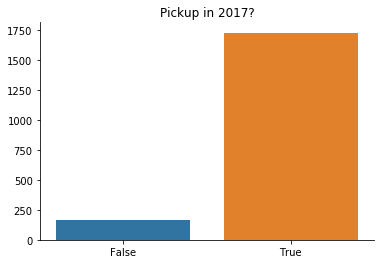

In [ ]:
counts = (wrong_dates.tpep_pickup_datetime.dt.year == 2017).value_counts()
sns.barplot(counts.index, counts.values)
plt.title("Pickup in 2017?")
sns.despine()

Except few data points, wrong_dates contains pickup dates in 2017.

In [ ]:
# end of 2017, beginning of 2018
print(len(wrong_dates.query('20171231 <= tpep_pickup_datetime <= 20180101')))
wrong_dates.query('20171231 <= tpep_pickup_datetime <= 20180101').head()

1723


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
275299,2.0,2017-12-31 00:20:00,2018-01-01 00:12:02,1.0,4.23,1.0,N,106.0,14.0,2.0,15.5,0.5,0.5,0.00,0.0,0.3,16.80
276211,2.0,2017-12-31 00:02:57,2018-01-01 00:00:57,1.0,2.29,1.0,N,79.0,261.0,1.0,10.5,0.5,0.5,1.18,0.0,0.3,12.98
277113,2.0,2017-12-31 00:37:57,2018-01-01 00:01:23,1.0,0.36,1.0,N,48.0,230.0,2.0,5.0,0.5,0.5,0.00,0.0,0.3,6.30
277867,2.0,2017-12-31 00:05:27,2018-01-01 00:01:03,1.0,1.08,1.0,N,79.0,148.0,1.0,6.5,0.5,0.5,0.00,0.0,0.3,7.80
278256,2.0,2017-12-31 00:32:47,2018-01-01 00:11:31,3.0,1.43,1.0,N,231.0,114.0,2.0,6.0,0.5,0.5,0.00,0.0,0.3,7.30


Out of 1896 mistakes, 1723 of them are actually trips starting in the end of 2017 and ending in 2018. So the data contans only 1896 -  1723 = 173 errors

Find those entries with same year and month but different year

In [ ]:
query_str = \
"(tpep_pickup_datetime.dt.year == tpep_dropoff_datetime.dt.year) & \
(tpep_pickup_datetime.dt.month == tpep_dropoff_datetime.dt.month) & \
(tpep_pickup_datetime.dt.year != 2017)"
same_month_year = wrong_dates.query(query_str)
print(len(same_month_year))
same_month_year.head()

160


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
46116,2.0,2009-01-01 00:19:39,2009-01-01 01:14:02,1.0,14.00,1.0,N,132.0,181.0,2.0,44.5,1.0,0.5,0.00,0.00,0.3,46.30
128504,2.0,2008-12-31 23:34:04,2008-12-31 23:39:41,1.0,0.93,1.0,N,237.0,140.0,2.0,5.5,0.0,0.5,0.00,0.00,0.3,6.30
11038,2.0,2009-01-01 00:22:33,2009-01-01 00:43:50,1.0,6.91,1.0,N,41.0,138.0,1.0,23.5,0.0,0.5,6.01,5.76,0.3,36.07
37675,2.0,2009-01-01 02:04:37,2009-01-01 02:38:12,1.0,10.69,1.0,N,138.0,230.0,2.0,34.5,0.0,0.5,0.00,5.76,0.3,41.06
37676,2.0,2009-01-01 02:46:05,2009-01-01 02:57:58,1.0,1.65,1.0,N,230.0,246.0,2.0,9.5,0.0,0.5,0.00,0.00,0.3,10.30


I could simply change these to 2017. But there is no way to be sure. Deleting 173 data points out of 113M doesn't affect the data very much.

Dask dataframe is much faster when it is indexed by date. Because it can sort the dates and partition the data by date ranges. During processing, Dask is not required to check all partitions which makes it efficient. Removing dates that are out of range will balance number of data points in the partitions. Otherwise some partitions will have few datapoints while others contain too many.

In [ ]:
# remove erroneous dates from y2017
y2017_ddf = y2017_ddf.query("tpep_pickup_datetime.dt.year == 2017")
# remove erroneous dates from y2018
y2018_ddf = y2018_ddf.query("tpep_pickup_datetime.dt.year == 2018")

In [ ]:
# don't drop pickup_datetime. It may be required to calculate durations, speed
y2017_ddf_final = y2017_ddf.set_index("tpep_pickup_datetime")
y2018_ddf_final = y2018_ddf.set_index("tpep_pickup_datetime")

In [ ]:
y2017_ddf_final.head()

,VendorID,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
tpep_pickup_datetime,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,2.0,2017-01-01 00:00:00,1.0,0.02,2.0,N,249.0,234.0,2.0,52.0,0.0,0.5,0.00,0.0,0.3,52.80
2017-01-01 00:00:02,1.0,2017-01-01 00:03:50,1.0,0.50,1.0,N,48.0,48.0,2.0,4.0,0.5,0.5,0.00,0.0,0.3,5.30
2017-01-01 00:00:02,2.0,2017-01-01 00:39:22,4.0,7.75,1.0,N,186.0,36.0,1.0,22.0,0.5,0.5,4.66,0.0,0.3,27.96
2017-01-01 00:00:03,1.0,2017-01-01 00:06:58,1.0,0.80,1.0,N,162.0,161.0,1.0,6.0,0.5,0.5,1.45,0.0,0.3,8.75
2017-01-01 00:00:05,1.0,2017-01-01 00:08:33,2.0,0.90,1.0,N,48.0,50.0,1.0,7.0,0.5,0.5,0.00,0.0,0.3,8.30


In [ ]:
y2018_ddf_final.head()

,VendorID,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
tpep_pickup_datetime,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,2.0,2018-01-01 00:00:00,1.0,9.14,1.0,N,229.0,17.0,2.0,27.0,0.0,0.5,0.0,0.0,0.3,27.8
2018-01-01 00:00:02,2.0,2018-01-01 00:08:48,1.0,1.36,1.0,N,68.0,249.0,2.0,7.5,0.5,0.5,0.0,0.0,0.3,8.8
2018-01-01 00:00:03,1.0,2018-01-01 00:21:06,1.0,6.10,1.0,N,255.0,236.0,2.0,20.5,0.5,0.5,0.0,0.0,0.3,21.8
2018-01-01 00:00:03,2.0,2018-01-01 00:03:52,3.0,0.99,1.0,N,236.0,43.0,2.0,5.5,0.5,0.5,0.0,0.0,0.3,6.8
2018-01-01 00:00:04,2.0,2018-01-01 00:08:13,1.0,1.59,1.0,N,141.0,161.0,2.0,8.0,0.5,0.5,0.0,0.0,0.3,9.3


#### Save as Parquet

Saving a dask dataframe as parquet relieves memory burden by efficiently storing computed results to disk. 

In [ ]:
# save to disk
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    y2017_ddf_final.to_parquet("taxi_data/y2017_ddf_final.parquet", engine="fastparquet")
    y2018_ddf_final.to_parquet("taxi_data/y2018_ddf_final.parquet", engine="fastparquet")

### Phase 2: EDA: Analysing Locations and Time Interval

In [ ]:
# load data

# directory structure of the mounted drive(for google colab)
directory_in_str = "/content/drive/My Drive/taxi_data/"

# load from disk
import warnings
with warnings.catch_warnings():
    y2017_ddf_final = dd.read_parquet("taxi_data/y2017_ddf_final.parquet")
    y2018_ddf_final = dd.read_parquet("taxi_data/y2018_ddf_final.parquet")

## A. Time Interval of Partitions

In [ ]:
y2017_ddf_final.columns

Index(['VendorID', 'tpep_dropoff_datetime', 'passenger_count', 'trip_distance',
       'RatecodeID', 'store_and_fwd_flag', 'PULocationID', 'DOLocationID',
       'payment_type', 'fare_amount', 'extra', 'mta_tax', 'tip_amount',
       'tolls_amount', 'improvement_surcharge', 'total_amount'],
      dtype='object')

The dataframe is sorted and divided by timestamps. The average duration of one partition is 2 days

In [ ]:
y2017_ddf_final.divisions[:5]

(Timestamp('2017-01-01 00:00:00'),
 Timestamp('2017-01-03 14:50:19'),
 Timestamp('2017-01-05 21:55:12'),
 Timestamp('2017-01-07 21:21:32'),
 Timestamp('2017-01-10 09:59:19'))

In [ ]:
# new dataframe
divs_df_2017 = pd.DataFrame()
divs_df_2017["division"] = y2017_ddf_final.divisions
# shifting back by one
divs_df_2017["prev_division"] = divs_df_2017.division.shift(1)
# find difference
divs_df_2017["difference"] = (divs_df_2017.division - divs_df_2017.prev_division)
# drop the null on the top
divs_df_2017.dropna(inplace=True)

# Only days, seconds and microseconds are stored internally. So astype with minute or hour is not supported
in_seconds = (divs_df_2017.division - divs_df_2017.prev_division).astype('timedelta64[s]')
# convert to hours and round it the nearest integer
divs_df_2017["difference(hours)"] = (in_seconds/3600.).map(np.round)
divs_df_2017.head()

,division,prev_division,difference,difference(hours)
1,2017-01-03 14:50:19,2017-01-01 00:00:00,2 days 14:50:19,63.0
2,2017-01-05 21:55:12,2017-01-03 14:50:19,2 days 07:04:53,55.0
3,2017-01-07 21:21:32,2017-01-05 21:55:12,1 days 23:26:20,47.0
4,2017-01-10 09:59:19,2017-01-07 21:21:32,2 days 12:37:47,61.0
5,2017-01-12 15:21:23,2017-01-10 09:59:19,2 days 05:22:04,53.0


In [ ]:
# do the same for 2018
divs_df_2018 = pd.DataFrame()
divs_df_2018["division"] = y2018_ddf_final.divisions
divs_df_2018["prev_division"] = divs_df_2018.division.shift(1)
divs_df_2018["difference"] = (divs_df_2018.division - divs_df_2018.prev_division)
divs_df_2018.dropna(inplace=True)

in_seconds = (divs_df_2018.division - divs_df_2018.prev_division).astype('timedelta64[s]')
divs_df_2018["difference(hours)"] = (in_seconds/3600.).map(np.round)
divs_df_2018.tail(5)

,division,prev_division,difference,difference(hours)
88,2018-06-21 09:42:44,2018-06-19 01:44:01,2 days 07:58:43,56.0
89,2018-06-23 14:53:44,2018-06-21 09:42:44,2 days 05:11:00,53.0
90,2018-06-26 09:14:23,2018-06-23 14:53:44,2 days 18:20:39,66.0
91,2018-06-28 15:06:40,2018-06-26 09:14:23,2 days 05:52:17,54.0
92,2018-12-21 16:39:43,2018-06-28 15:06:40,176 days 01:33:03,4226.0


The last parition covers a large duration. Dask creates partitions of same block-size. Thus, I can conclude that their is no much data after June 2018. The number of data points after June is the same as  the number of data points collected before June in 2 days interval.

In [ ]:
configure_plotly_browser_state()

box2017 = go.Box(y=divs_df_2017["difference(hours)"], name="2017")
box2018 = go.Box(y=divs_df_2018["difference(hours)"].drop(92), name="2018")

# layout is not working

# layout = go.Layout(
#         xaxis=dict(
#         title="Year",
#         titlefont=dict(
#             family='Arial, sans-serif',
#             size=18,
#             #color='lightgrey'
#         ),
#         range=[1, 5],
#         showticklabels=True,

#     ),
    
#     yaxis=dict(
#         title="Interval(hours)",
#         titlefont=dict(
#             family='Arial, sans-serif',
#             size=18
#             #color='lightgrey'
#         ),
#         showticklabels=True,
        
#     ),
# )

data = [box2017, box2018]
pyo.iplot(data)

In [ ]:
configure_plotly_browser_state()
hist_2017 = [divs_df_2017["difference(hours)"]]
group_labels = ['Duration']
fig = ff.create_distplot(hist_2017, group_labels, show_hist=False)
fig['layout'].update(title='Partition Interval(2017)')

pyo.iplot(fig, filename='Basic Distplot')

In [ ]:
#configure_plotly_browser_state() #for colab
hist_2018 = [divs_df_2018["difference(hours)"].drop(92)]
group_labels = ['Duration']
fig = ff.create_distplot(hist_2018, group_labels, show_hist=False)
fig['layout'].update(title='Partition Interval(2018)')
pyo.iplot(fig, filename='Basic Distplot')

In [ ]:
# randomly select 4 sample partitions
choice_2017 = np.random.choice(np.arange(165), 4)
# not including the last partition(for 2018)
choice_2018 = np.random.choice(np.arange(91), 4)

to_plot_2017 = []
to_plot_2018 = []

# loop over selected partitions
for c in choice_2017:
  # get DateTimeIndex of the partition
  partition_ix = pd.Series(y2017_ddf_final.get_partition(c).index.compute())
  # shift by one
  prev_partition_ix = pd.Series(partition_ix).shift(1)
  # find difference between current and previous
  diff = (partition_ix - prev_partition_ix).astype("timedelta64[s]")
  # find value counts, ignore count of 0
  vcounts = diff.value_counts().drop(0)
  # get total sum
  total_sum = vcounts.sum()
  # get relative counts
  vcounts = (vcounts * 100)/total_sum
  # append to relative valuce counts to a list
  to_plot_2017.append(vcounts) 

# do the same for 2018
for c in choice_2018:
  partition_ix = pd.Series(y2018_ddf_final.get_partition(c).index.compute())
  prev_partition_ix = pd.Series(partition_ix).shift(1)
  diff = (partition_ix - prev_partition_ix).astype("timedelta64[s]")
  vcounts = diff.value_counts().drop(0)
  total_sum = vcounts.sum()
  vcounts = (vcounts * 100)/total_sum
  to_plot_2018.append(vcounts) 

In [ ]:
print("partition ", choice_2017[0])
to_plot_2017[0]

partition  130


1.0     92.747058
2.0      4.471125
3.0      1.289280
4.0      0.610313
5.0      0.332996
6.0      0.207042
7.0      0.121630
8.0      0.084330
9.0      0.049193
11.0     0.028651
10.0     0.027570
12.0     0.009730
13.0     0.006487
15.0     0.003784
14.0     0.003243
17.0     0.002162
21.0     0.001622
18.0     0.001081
19.0     0.001081
20.0     0.000541
28.0     0.000541
16.0     0.000541
Name: tpep_pickup_datetime, dtype: float64

In [ ]:
configure_plotly_browser_state()
traces_2017 = []
traces_2018 = []
# used https://coolors.co
colors = ['#04E762', '#F5B700', '#00A1E4', '#DC0073']
for i in range(4):
  trace0 = go.Bar(
      x=list(to_plot_2017[i].index),
      y=list(np.round(to_plot_2017[i].values)),
      name=f"2017-P{choice_2017[i]}",
       marker=dict(
        color=colors[i], opacity=0.7

    )
  )
  trace1 = go.Bar(
      x=list(to_plot_2018[i].index),
      y=list(np.round(to_plot_2018[i].values)),
      name=f"2017-P{choice_2018[i]}",
       marker=dict(
        color=colors[i], opacity=0.7
       )
  )
  traces_2017.append(trace0)
  traces_2018.append(trace1)

layout = go.Layout(
        xaxis=dict(
        title="Seconds",
        titlefont=dict(
            family='Arial, sans-serif',
            size=18,
            #color='lightgrey'
        ),
        range=[1, 5],
        showticklabels=True,

    ),
    
    yaxis=dict(
        title="Percentage",
        titlefont=dict(
            family='Arial, sans-serif',
            size=18
            #color='lightgrey'
        ),
        showticklabels=True,
        
    ),
     barmode='overlay'

)
layout.title = "Relative Count of Durations-2017"
fig2017 = go.Figure(data= traces_2017, layout=layout)
layout.title = "Relative Count of Durations-2018"
fig2018 = go.Figure(data=traces_2018, layout=layout)


# Plot it and save as bar_plot.html

# static plot
#config={'scrollZoom':False,'displayModeBar':False, "showLink":False, 'showTips':False, "staticPlot":True}
pyo.iplot(fig2017, filename = 'bar_plot')
pyo.iplot(fig2018, filename = 'bar_plot')

The charts clearly show that the data contains time series data in seconds interval. However this does not reflect the intervals within specific locations. Next I did the same analysis for some locations

## B. Number of Trips by Boroughs

<img src="https://drive.google.com/uc?export=view&id=1BPzE6igHKCHTar1SDK6Xeyg4E9zu6b2s" width="700"/>

In [ ]:
# utilitly functions
def get_lat_lon(sf):
    content = []
    for sr in sf.shapeRecords():
        shape = sr.shape
        rec = sr.record
        loc_id = rec[shp_dic['LocationID']]
        
        x = (shape.bbox[0]+shape.bbox[2])/2
        y = (shape.bbox[1]+shape.bbox[3])/2
        
        content.append((loc_id, x, y))
    return pd.DataFrame(content, columns=["LocationID", "longitude", "latitude"])

def get_boundaries(sf):
    lat, lon = [], []
    for shape in list(sf.iterShapes()):
        lat.extend([shape.bbox[0], shape.bbox[2]])
        lon.extend([shape.bbox[1], shape.bbox[3]])

    margin = 0.01 # buffer to add to the range
    lat_min = min(lat) - margin
    lat_max = max(lat) + margin
    lon_min = min(lon) - margin
    lon_max = max(lon) + margin

    return lat_min, lat_max, lon_min, lon_max

def draw_region_map(ax, sf, heat={}):
    continent = [235/256, 151/256, 78/256]
    ocean = (89/256, 171/256, 227/256)    
    
    reg_list={'Staten Island':1, 'Queens':2, 'Bronx':3, 'Manhattan':4, 'EWR':5, 'Brooklyn':6}
    reg_x = {'Staten Island':[], 'Queens':[], 'Bronx':[], 'Manhattan':[], 'EWR':[], 'Brooklyn':[]}
    reg_y = {'Staten Island':[], 'Queens':[], 'Bronx':[], 'Manhattan':[], 'EWR':[], 'Brooklyn':[]}
    
    if len(heat) != 0:
        norm = mpl.colors.Normalize(vmin=math.sqrt(min(heat.values())), vmax=math.sqrt(max(heat.values()))) #norm = mpl.colors.LogNorm(vmin=1,vmax=max(heat))
        cm=plt.get_cmap('Reds')
       
    ax.set_facecolor(ocean)
    for sr in sf.shapeRecords():
        shape = sr.shape
        rec = sr.record
        reg_name = rec[shp_dic['borough']]
        
        if len(heat) == 0:
            norm = mpl.colors.Normalize(vmin=1,vmax=6) #norm = mpl.colors.LogNorm(vmin=1,vmax=max(heat))
            cm=plt.get_cmap('Pastel1')
            R,G,B,A = cm(norm(reg_list[reg_name]))
            col = [R,G,B]
        else:
            R,G,B,A = cm(norm(math.sqrt(heat[reg_name])))
            col = [R,G,B]
            
        # check number of parts (could use MultiPolygon class of shapely?)
        nparts = len(shape.parts) # total parts
        if nparts == 1:
            polygon = Polygon(shape.points)
            patch = PolygonPatch(polygon, facecolor=col, alpha=1.0, zorder=2)
            ax.add_patch(patch)
        else: # loop over parts of each shape, plot separately
            for ip in range(nparts): # loop over parts, plot separately
                i0 = shape.parts[ip]
                if ip < nparts-1:
                    i1 = shape.parts[ip+1]-1
                else:
                    i1 = len(shape.points)

                polygon = Polygon(shape.points[i0:i1+1])
                patch = PolygonPatch(polygon, facecolor=col, alpha=1.0, zorder=2)
                ax.add_patch(patch)
                
        reg_x[reg_name].append((shape.bbox[0]+shape.bbox[2])/2)
        reg_y[reg_name].append((shape.bbox[1]+shape.bbox[3])/2)
        
    for k in reg_list:
        if len(heat)==0:
            plt.text(np.mean(reg_x[k]), np.mean(reg_y[k]), k, horizontalalignment='center', verticalalignment='center',
                        bbox=dict(facecolor='black', alpha=0.5), color="white", fontsize=12)     
        else:
            plt.text(np.mean(reg_x[k]), np.mean(reg_y[k]), "{}\n({}K)".format(k, heat[k]/1000), horizontalalignment='center', 
                     verticalalignment='center',bbox=dict(facecolor='black', alpha=0.5), color="white", fontsize=12)       

    # display
    limits = get_boundaries(sf)
    plt.xlim(limits[0], limits[1])
    plt.ylim(limits[2], limits[3])

def draw_zone_map(ax, sf, heat={}, text=[], arrows=[]):
    continent = [235/256, 151/256, 78/256]
    ocean = (89/256, 171/256, 227/256)
    theta = np.linspace(0, 2*np.pi, len(text)+1).tolist()
    ax.set_facecolor(ocean)
    
    # colorbar
    if len(heat) != 0:
        norm = mpl.colors.Normalize(vmin=min(heat.values()),vmax=max(heat.values())) #norm = mpl.colors.LogNorm(vmin=1,vmax=max(heat))
        cm=plt.get_cmap('Reds')
        sm = plt.cm.ScalarMappable(cmap=cm, norm=norm)
        sm.set_array([])
        plt.colorbar(sm, ticks=np.linspace(min(heat.values()),max(heat.values()),8),
                     boundaries=np.arange(min(heat.values())-10,max(heat.values())+10,.1))
    
    for sr in sf.shapeRecords():
        shape = sr.shape
        rec = sr.record
        loc_id = rec[shp_dic['LocationID']]
        zone = rec[shp_dic['zone']]
        
        if len(heat) == 0:
            col = continent
        else:
            if loc_id not in heat:
                R,G,B,A = cm(norm(0))
            else:
                R,G,B,A = cm(norm(heat[loc_id]))
            col = [R,G,B]

        # check number of parts (could use MultiPolygon class of shapely?)
        nparts = len(shape.parts) # total parts
        if nparts == 1:
            polygon = Polygon(shape.points)
            patch = PolygonPatch(polygon, facecolor=col, alpha=1.0, zorder=2)
            ax.add_patch(patch)
        else: # loop over parts of each shape, plot separately
            for ip in range(nparts): # loop over parts, plot separately
                i0 = shape.parts[ip]
                if ip < nparts-1:
                    i1 = shape.parts[ip+1]-1
                else:
                    i1 = len(shape.points)

                polygon = Polygon(shape.points[i0:i1+1])
                patch = PolygonPatch(polygon, facecolor=col, alpha=1.0, zorder=2)
                ax.add_patch(patch)
        
        x = (shape.bbox[0]+shape.bbox[2])/2
        y = (shape.bbox[1]+shape.bbox[3])/2
        if (len(text) == 0 and rec[shp_dic['Shape_Area']] > 0.0001):
            plt.text(x, y, str(loc_id), horizontalalignment='center', verticalalignment='center')            
        elif len(text) != 0 and loc_id in text:
            #plt.text(x+0.01, y-0.01, str(loc_id), fontsize=12, color="white", bbox=dict(facecolor='black', alpha=0.5))
            eta_x = 0.05*np.cos(theta[text.index(loc_id)])
            eta_y = 0.05*np.sin(theta[text.index(loc_id)])
            ax.annotate("[{}] {}".format(loc_id, zone), xy=(x, y), xytext=(x+eta_x, y+eta_y),
                        bbox=dict(facecolor='black', alpha=0.5), color="white", fontsize=12,
                        arrowprops=dict(facecolor='black', width=3, shrink=0.05))
    if len(arrows)!=0:
        for arr in arrows:
            ax.annotate('', xy = arr['dest'], xytext = arr['src'], size = arr['cnt'],
                    arrowprops=dict(arrowstyle="fancy", fc="0.6", ec="none"))
    
    # display
    limits = get_boundaries(sf)
    plt.xlim(limits[0], limits[1])
    plt.ylim(limits[2], limits[3])


In [ ]:
directory_in_str = "/content/drive/My Drive/taxi_data/"
sf = shapefile.Reader(directory_in_str + "taxi_zones/taxi_zones.shp")
fields_name = [field[0] for field in sf.fields[1:]]
shp_dic = dict(zip(fields_name, list(range(len(fields_name)))))
attributes = sf.records()
shp_attr = [dict(zip(fields_name, attr)) for attr in attributes]

df_loc = pd.DataFrame(shp_attr).join(get_lat_lon(sf).set_index("LocationID"), on="LocationID")
df_loc.head()


,LocationID,OBJECTID,Shape_Area,Shape_Leng,borough,zone,longitude,latitude
0,1,1,0.000782,0.116357,EWR,Newark Airport,9.366817e+05,190522.130278
1,2,2,0.004866,0.433470,Queens,Jamaica Bay,1.033536e+06,161853.982300
2,3,3,0.000314,0.084341,Bronx,Allerton/Pelham Gardens,1.027136e+06,254730.010849
3,4,4,0.000112,0.043567,Manhattan,Alphabet City,9.904240e+05,203100.040432
4,5,5,0.000498,0.092146,Staten Island,Arden Heights,9.321332e+05,139954.541936


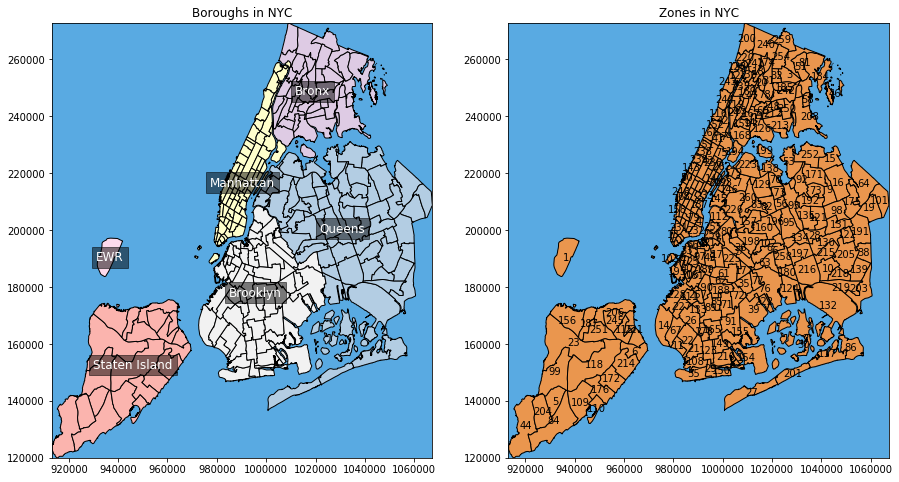

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,8))
ax = plt.subplot(1, 2, 1)
ax.set_title("Boroughs in NYC")
draw_region_map(ax, sf)
ax = plt.subplot(1, 2, 2)
ax.set_title("Zones in NYC")
draw_zone_map(ax, sf)


The location ids are mapped into Boroughs and Zones. Manhattan is densly populated. Queens covers the largest area.

In [ ]:
# load zone lookup csv
zone_lookup = pd.read_csv("taxi_data/taxi+_zone_lookup.csv")

In [ ]:
zone_lookup.head()

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [ ]:
zone_lookup.Borough.unique()

array(['EWR', 'Queens', 'Bronx', 'Manhattan', 'Staten Island', 'Brooklyn',
       'Unknown'], dtype=object)

In [ ]:
# convert boroughs to numerical indices
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(zone_lookup.Borough)
print(le.classes_)
zone_lookup.loc[:, "Borough_Label"] = le.transform(zone_lookup.Borough)
zone_lookup[["Borough", "Borough_Label"]].head()

['Bronx' 'Brooklyn' 'EWR' 'Manhattan' 'Queens' 'Staten Island' 'Unknown']


,Borough,Borough_Label
0,EWR,2
1,Queens,4
2,Bronx,0
3,Manhattan,3
4,Staten Island,5


EWR is newark airport. The others are the 5 boroughs of newyork.

In [ ]:
# convert it to dictionary for easy access
zone_dict = dict(zip(zone_lookup.LocationID, zone_lookup.Borough_Label))

In [ ]:
# create new column
# it uses a dictionary to convert text into numerical labels
y2017_ddf_final["Borugh"] = y2017_ddf_final.PULocationID.map(zone_dict)
y2018_ddf_final["Borugh"] = y2018_ddf_final.PULocationID.map(zone_dict)
y2017_ddf_final.head()

,VendorID,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,Borugh
tpep_pickup_datetime,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,2.0,2017-01-01 00:00:00,1.0,0.02,2.0,N,249.0,234.0,2.0,52.0,0.0,0.5,0.00,0.0,0.3,52.80,3
2017-01-01 00:00:02,1.0,2017-01-01 00:03:50,1.0,0.50,1.0,N,48.0,48.0,2.0,4.0,0.5,0.5,0.00,0.0,0.3,5.30,3
2017-01-01 00:00:02,2.0,2017-01-01 00:39:22,4.0,7.75,1.0,N,186.0,36.0,1.0,22.0,0.5,0.5,4.66,0.0,0.3,27.96,3
2017-01-01 00:00:03,1.0,2017-01-01 00:06:58,1.0,0.80,1.0,N,162.0,161.0,1.0,6.0,0.5,0.5,1.45,0.0,0.3,8.75,3
2017-01-01 00:00:05,1.0,2017-01-01 00:08:33,2.0,0.90,1.0,N,48.0,50.0,1.0,7.0,0.5,0.5,0.00,0.0,0.3,8.30,3


In [ ]:
# trips by Borough
# groupby Borough and count trips
trips_by_borough_2017 = y2017_ddf_final.Borugh.groupby(y2017_ddf_final.Borugh).count()
trips_by_borough_2017 = trips_by_borough_2017.compute().sort_values(ascending=False)
# do the same for 2018
trips_by_borough_2018 = y2018_ddf_final.Borugh.groupby(y2018_ddf_final.Borugh).count()
trips_by_borough_2018 = trips_by_borough_2018.compute().sort_values(ascending=False)

In [ ]:
# epislon helps prevent Division by Zero
relative_borough_2017 = (trips_by_borough_2017 * 100 / trips_by_borough_2017.sum()) + 1e-10
relative_borough_2018 = (trips_by_borough_2018 * 100 / trips_by_borough_2018.sum()) + 1e-10

90% of all trips started from Manhattan

6% of all trips started from Queens

In [ ]:
relative_borough_2017

Borugh
3    90.819441
4     6.151634
6     1.560034
1     1.377861
0     0.081527
2     0.007360
5     0.002144
Name: Borugh, dtype: float64

In [ ]:
relative_borough_2018

Borugh
3    90.801905
4     6.191974
6     1.620812
1     1.272284
0     0.104396
2     0.007123
5     0.001506
Name: Borugh, dtype: float64

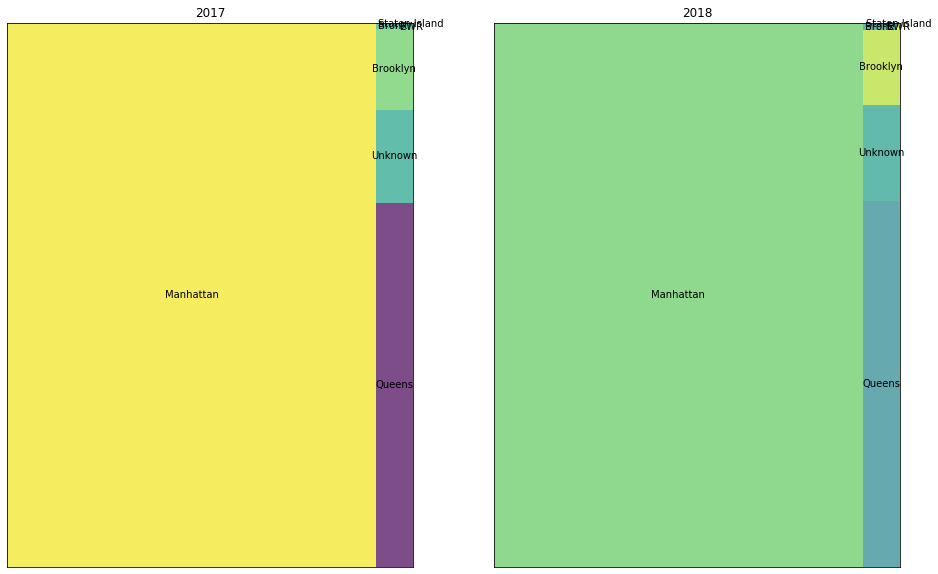

In [ ]:
# visualize tree map
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(16,10))
ax1.set_title("2017")
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
count_indices = list(le.inverse_transform(relative_borough_2017.index))
squarify.plot(sizes=relative_borough_2017.values, label=count_indices, alpha=.7, ax=ax1)

ax2.set_title("2018")
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)
count_indices = list(le.inverse_transform(relative_borough_2018.index))
squarify.plot(sizes=relative_borough_2018.values, label=count_indices, alpha=.7, ax=ax2)
plt.show()

## C. Trips in Manhattan

In [ ]:
# Let me see the trip distribution in Manhattan only
y2017_manhattan = y2017_ddf_final.query("Borugh == 3.0")
y2018_manhattan = y2018_ddf_final.query("Borugh == 3.0")

manhattan_tloc_2017 = y2017_manhattan.PULocationID.groupby(y2017_manhattan.PULocationID).count()
manhattan_tloc_2017 = manhattan_tloc_2017.compute().sort_values(ascending=False)
# do the same for 2018
manhattan_tloc_2018 = y2018_manhattan.PULocationID.groupby(y2018_manhattan.PULocationID).count()
manhattan_tloc_2018 = manhattan_tloc_2018.compute().sort_values(ascending=False)

# epislon helps prevent Division by Zero
relative_mt_2017 = (manhattan_tloc_2017 * 100 / manhattan_tloc_2017.sum()) + 1e-10
relative_mt_2018 = (manhattan_tloc_2018 * 100 / manhattan_tloc_2018.sum()) + 1e-10

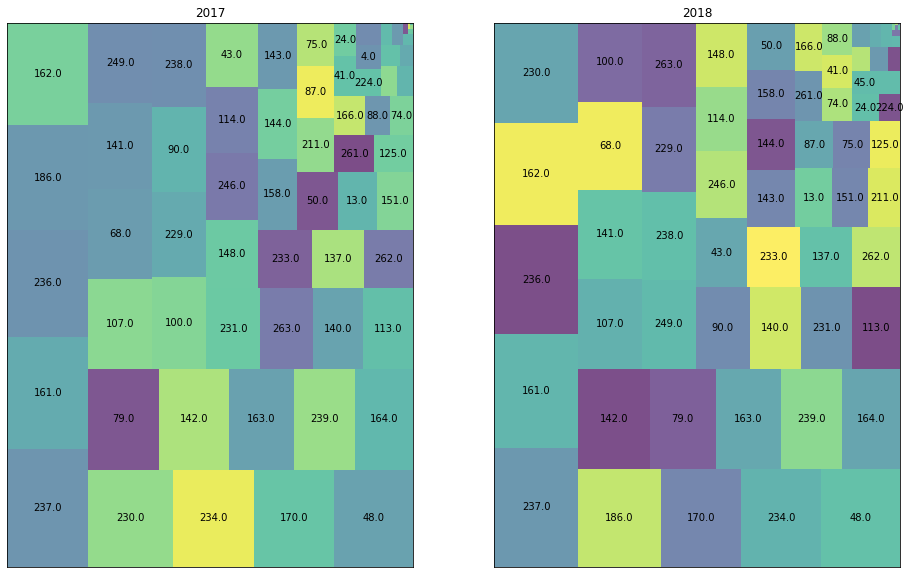

In [ ]:
# visualize tree map
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(16,10))
ax1.set_title("2017")
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
count_indices = relative_mt_2017.index
indices = ["" if i > 50 else count_indices[i] for i in range(len(count_indices))]

squarify.plot(sizes=relative_mt_2017.values, label=indices, alpha=.7, ax=ax1)

ax2.set_title("2018")
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)
count_indices = relative_mt_2018.index
indices = ["" if i > 50 else count_indices[i] for i in range(len(count_indices))]

squarify.plot(sizes=relative_mt_2018.values, label=indices, alpha=.7, ax=ax2)
plt.show()

These locations have a fair number of trips except few ones

In [ ]:
manhattan_tloc_2017.iloc[-10:]

PULocationID
243.0    22670
127.0    11228
194.0     6940
202.0     5290
153.0     1117
128.0      709
120.0      664
105.0      123
104.0        1
103.0        1
Name: PULocationID, dtype: int64

In [ ]:
manhattan_tloc_2018.iloc[-10:]

PULocationID
12.0     25748
243.0    13252
127.0     6487
194.0     3538
202.0     2597
153.0      951
128.0      451
120.0      341
105.0       63
104.0        1
Name: PULocationID, dtype: int64

**Where are trips picked from Manhattan destined to?**

In [ ]:
# convert it to dictionary for easy access
zone_dict = dict(zip(zone_lookup.LocationID, zone_lookup.Borough_Label))
# create new column
# it uses a dictionary to convert text into numerical labels
y2017_manhattan["DBorugh"] = y2017_manhattan.DOLocationID.map(zone_dict)
y2018_manhattan["DBorugh"] = y2018_manhattan.DOLocationID.map(zone_dict)
y2018_manhattan.head()

,VendorID,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,Borugh,DBorugh
tpep_pickup_datetime,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,2.0,2018-01-01 00:00:00,1.0,9.14,1.0,N,229.0,17.0,2.0,27.0,0.0,0.5,0.00,0.0,0.3,27.80,3,1
2018-01-01 00:00:02,2.0,2018-01-01 00:08:48,1.0,1.36,1.0,N,68.0,249.0,2.0,7.5,0.5,0.5,0.00,0.0,0.3,8.80,3,3
2018-01-01 00:00:03,2.0,2018-01-01 00:03:52,3.0,0.99,1.0,N,236.0,43.0,2.0,5.5,0.5,0.5,0.00,0.0,0.3,6.80,3,3
2018-01-01 00:00:04,2.0,2018-01-01 00:08:13,1.0,1.59,1.0,N,141.0,161.0,2.0,8.0,0.5,0.5,0.00,0.0,0.3,9.30,3,3
2018-01-01 00:00:06,1.0,2018-01-01 00:24:34,1.0,6.90,1.0,N,162.0,49.0,1.0,23.5,0.5,0.5,4.95,0.0,0.3,29.75,3,1


In [ ]:
y2017_manh_dest = y2017_manhattan.DBorugh.value_counts().compute()
y2018_manh_dest = y2018_manhattan.DBorugh.value_counts().compute()

In [ ]:
y2017_manh_destR = y2017_manh_dest * 100/y2017_manh_dest.sum()
y2018_manh_destR = y2018_manh_dest * 100/y2018_manh_dest.sum()

In [ ]:
y2017_manh_dest

3    95239949
4     3693112
1     3202194
0      509396
6      214523
2      202164
5       15736
Name: DBorugh, dtype: int64

In [ ]:
y2017_manh_destR

3    92.396830
4     3.582865
1     3.106602
0     0.494189
6     0.208119
2     0.196129
5     0.015266
Name: DBorugh, dtype: float64

95 % of trips that originated from Manhattan end in Manhattan.

## D. Number of Trips by Pickup Location

In [ ]:
# groupby Location ID and count trips
trips_by_loc_2017 = y2017_ddf_final.PULocationID.groupby(y2017_ddf_final.PULocationID).count()
# compute 
trips_by_loc_2017 = trips_by_loc_2017.compute().sort_values(ascending=False)

# do the same for 2018
trips_by_loc_2018 = y2018_ddf_final.PULocationID.groupby(y2018_ddf_final.PULocationID).count()
trips_by_loc_2018 = trips_by_loc_2018.compute().sort_values(ascending=False)

In [ ]:
assert(trips_by_loc_2017.sum() == 113496706)

In [ ]:
# relative counts in percent
# epislon helps prevent Division by Zero
relative_2017 = (trips_by_loc_2017 * 100 / trips_by_loc_2017.sum()) + 1e-10
relative_2018 = (trips_by_loc_2018 * 100 / trips_by_loc_2018.sum()) + 1e-10

The top 50 locations are mostly Manhttan

In [ ]:
# replace location ids by their corresponding boroughs
locations_boroughs_2017 = pd.Series(trips_by_loc_2017.index).replace(zone_dict)

In [ ]:
le.classes_

array(['Bronx', 'Brooklyn', 'EWR', 'Manhattan', 'Queens', 'Staten Island',
       'Unknown'], dtype=object)

In [ ]:
# holds list of dictionaris
locs_in_borough = []

# divide the 265 partitions into 4 parts
for i in range(0, 200, 66):
  locs_in_borough.append(locations_boroughs_2017[i:i+66].value_counts().to_dict())
col_names = list(le.classes_)

# convert list of dictionaries to dataframe
locs_in_borough_df = pd.DataFrame(locs_in_borough).fillna(0)
locs_in_borough_df.columns = col_names
# drop EWR and Unknown
locs_in_borough_df.drop(["EWR", "Unknown"], axis=1, inplace=True)
locs_in_borough_df.index = ["[0-66)", "[66-132)", "[132-192)", "[192-258)"]
locs_in_borough_df

,Bronx,Brooklyn,Manhattan,Queens,Staten Island
[0-66),0.0,4,56,5,0.0
[66-132),5.0,27,7,25,0.0
[132-192),25.0,23,1,17,0.0
[192-258),13.0,7,4,22,20.0


In [ ]:
configure_plotly_browser_state()
 # used https://coolors.co
colors = ['#04E762', '#F5B700', '#00A1E4', '#DC0073']
traces = []
for i, col in enumerate(locs_in_borough_df):
  trace = go.Bar(
      x=locs_in_borough_df.index,
      y=locs_in_borough_df[col],
      name=col
#        marker=dict(
#         color=colors[i], opacity=0.7

#     )
  )
  traces.append(trace)


layout = go.Layout(
          xaxis=dict(
          title="Rank of Location(by Num of Trips)",
          titlefont=dict(
              family='Arial, sans-serif',
              size=18,
              #color='lightgrey'
          ),
          showticklabels=True,

      ),

      yaxis=dict(
          title="Count of Locations",
          titlefont=dict(
              family='Arial, sans-serif',
              size=18
              #color='lightgrey'
          ),
          showticklabels=True,

      ),
       barmode='stack'

  )
layout.title = "Number of Locations in the 5 Boroughs of NYC"
fig= go.Figure(data= traces, layout=layout)
pyo.iplot(fig, filename = 'bar_plot')


In [ ]:
trips_by_loc_2017.iloc[100:120]


PULocationID
188.0    13806
228.0    12483
225.0    12276
127.0    11228
217.0    10441
89.0      9700
130.0     9131
196.0     8863
1.0       8353
216.0     8290
215.0     8081
195.0     7342
28.0      7292
194.0     6940
219.0     6570
207.0     6034
159.0     5908
54.0      5871
134.0     5868
190.0     5637
Name: PULocationID, dtype: int64

A tree-map shows that around 55 locations have similar number of trips.

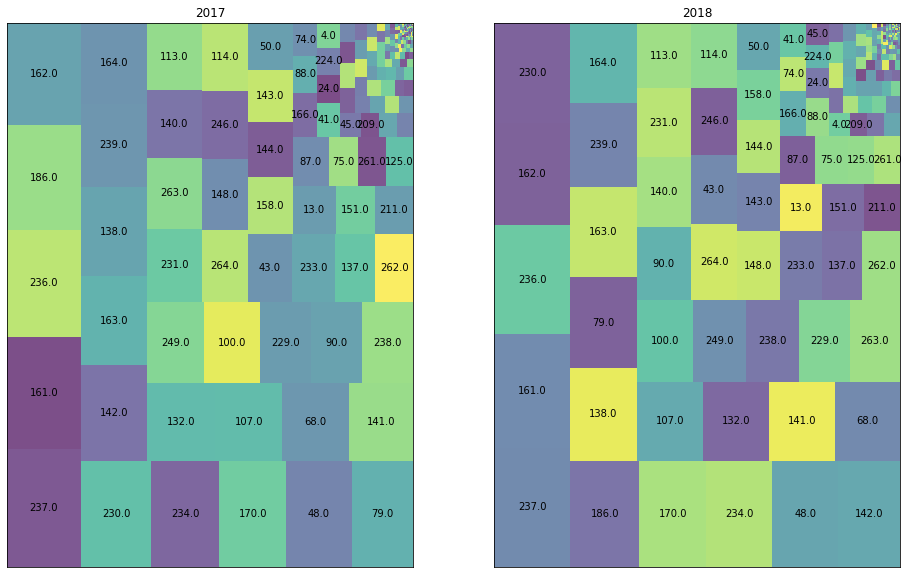

In [ ]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(16,10))
ax1.set_title("2017")
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
count_indices = list(relative_2017.index)
indices = ["" if i > 55 else count_indices[i] for i in range(len(count_indices))]
squarify.plot(sizes=relative_2017.values, label=indices, alpha=.7, ax=ax1)

ax2.set_title("2018")
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)
count_indices = list(relative_2018.index)
indices = ["" if i > 55 else count_indices[i] for i in range(len(count_indices))]
squarify.plot(sizes=relative_2018.values, label=indices, alpha=.7, ax=ax2)
plt.show()

In [ ]:
# sample paritions to test
choice_2017 = np.random.choice(np.arange(165), 4)
choice_2018 = np.random.choice(np.arange(91), 4)

def plot_date_differences(loc_id, xrange):
  # collect value counts for selected partitions in 2017
  to_plot_2017 = []
  # collect value counts for selected partitions in 2018
  to_plot_2018 = []
  # filter dask dataframe by the given location
  y2017_selected = y2017_ddf_final.query(f"PULocationID == {loc_id}")
  y2018_selected = y2018_ddf_final.query(f"PULocationID == {loc_id}")
  for c in choice_2017:
    # convert the dates in partition c to pandas series
    partition_ix = pd.Series(y2017_selected.get_partition(c).index.compute())
    # shift it down by one
    prev_partition_ix = pd.Series(partition_ix).shift(1)
    # find difference and convert to seconds
    diff = (partition_ix - prev_partition_ix).astype("timedelta64[s]")
    # get value counts
    vcounts = diff.value_counts()
    # ignore same consecutive dates
    if(0 in vcounts.index):
      vcounts = vcounts.drop(0)
    # get the sum of all counts
    total_sum = vcounts.sum()
    # relative count in percentage
    vcounts = (vcounts * 100)/total_sum
    # append it to list of vcounts
    to_plot_2017.append(vcounts) 
  # do the same for 2018
  for c in choice_2018:
    partition_ix = pd.Series(y2018_selected.get_partition(c).index.compute())
    prev_partition_ix = pd.Series(partition_ix).shift(1)
    diff = (partition_ix - prev_partition_ix).astype("timedelta64[s]")
    vcounts = diff.value_counts()
    if(0 in vcounts.index):
      vcounts = vcounts.drop(0)    
    total_sum = vcounts.sum()
    vcounts = (vcounts * 100)/total_sum
    to_plot_2018.append(vcounts) 


  configure_plotly_browser_state()
  traces_2017 = []
  traces_2018 = []
  # used https://coolors.co
  colors = ['#04E762', '#F5B700', '#00A1E4', '#DC0073']
  # for i in four partitions
  for i in range(4):
    # 2017
    trace0 = go.Bar(
        x=list(to_plot_2017[i].index),
        y=list(np.round(to_plot_2017[i].values)),
        name=f"2017-P{choice_2017[i]}",
         marker=dict(
          color=colors[i], opacity=0.7

      )
    )
    # 2018
    trace1 = go.Bar(
        x=list(to_plot_2018[i].index),
        y=list(np.round(to_plot_2018[i].values)),
        name=f"2018-P{choice_2018[i]}",
         marker=dict(
          color=colors[i], opacity=0.7
         )
    )
    traces_2017.append(trace0)
    traces_2018.append(trace1)

  layout = go.Layout(
          xaxis=dict(
          title="Seconds",
          titlefont=dict(
              family='Arial, sans-serif',
              size=18,
              #color='lightgrey'
          ),
          range=xrange,
          showticklabels=True,

      ),

      yaxis=dict(
          title="Percentage",
          titlefont=dict(
              family='Arial, sans-serif',
              size=18
              #color='lightgrey'
          ),
          showticklabels=True,

      ),
       barmode='overlay'

  )
  layout.title = f"Relative Count of Durations-2017 at Location {loc_id}"
  fig2017 = go.Figure(data= traces_2017, layout=layout)
  layout.title = f"Relative Count of Durations-2018 at Location {loc_id}"
  fig2018 = go.Figure(data=traces_2018, layout=layout)


  # Plot it and save as bar_plot.html

  # static plot
  #config={'scrollZoom':False,'displayModeBar':False, "showLink":False, 'showTips':False, "staticPlot":True}
  pyo.iplot(fig2017, filename = 'bar_plot')
  pyo.iplot(fig2018, filename = 'bar_plot')


Next I tried to visualize date intervals of  locations. Some are popular, others are not

In [ ]:
# The location where most trips started
plot_date_differences(237, [1, 35])

In [ ]:
# Location 244 is ranked between 66 and 70( It is not far from the top)
plot_date_differences(244, xrange=[0,700])

In [ ]:
# location 182 is ranked above 80
plot_date_differences(182, xrange=None)

Most locations have very small observations(those that are ranked below 100) and there is a gap between their trips. A gap of 80k seconds is almost a day.

I decided to work on trips that started from Manhattan. Because >90% of trips were picked up from there and 95% passengers were dropped in the same Borough

In [ ]:
y2017_manhattan.head()

,VendorID,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,Borugh,DBorugh
tpep_pickup_datetime,,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,2.0,2017-01-01 00:00:00,1.0,0.02,2.0,N,249.0,234.0,2.0,52.0,0.0,0.5,0.00,0.0,0.3,52.80,3,3
2017-01-01 00:00:02,1.0,2017-01-01 00:03:50,1.0,0.50,1.0,N,48.0,48.0,2.0,4.0,0.5,0.5,0.00,0.0,0.3,5.30,3,3
2017-01-01 00:00:02,2.0,2017-01-01 00:39:22,4.0,7.75,1.0,N,186.0,36.0,1.0,22.0,0.5,0.5,4.66,0.0,0.3,27.96,3,1
2017-01-01 00:00:03,1.0,2017-01-01 00:06:58,1.0,0.80,1.0,N,162.0,161.0,1.0,6.0,0.5,0.5,1.45,0.0,0.3,8.75,3,3
2017-01-01 00:00:05,1.0,2017-01-01 00:08:33,2.0,0.90,1.0,N,48.0,50.0,1.0,7.0,0.5,0.5,0.00,0.0,0.3,8.30,3,3


In [ ]:
y2018_manhattan.head()

,VendorID,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,Borugh,DBorugh
tpep_pickup_datetime,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,2.0,2018-01-01 00:00:00,1.0,9.14,1.0,N,229.0,17.0,2.0,27.0,0.0,0.5,0.00,0.0,0.3,27.80,3,1
2018-01-01 00:00:02,2.0,2018-01-01 00:08:48,1.0,1.36,1.0,N,68.0,249.0,2.0,7.5,0.5,0.5,0.00,0.0,0.3,8.80,3,3
2018-01-01 00:00:03,2.0,2018-01-01 00:03:52,3.0,0.99,1.0,N,236.0,43.0,2.0,5.5,0.5,0.5,0.00,0.0,0.3,6.80,3,3
2018-01-01 00:00:04,2.0,2018-01-01 00:08:13,1.0,1.59,1.0,N,141.0,161.0,2.0,8.0,0.5,0.5,0.00,0.0,0.3,9.30,3,3
2018-01-01 00:00:06,1.0,2018-01-01 00:24:34,1.0,6.90,1.0,N,162.0,49.0,1.0,23.5,0.5,0.5,4.95,0.0,0.3,29.75,3,1


In [ ]:
# save to disk
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    y2017_manhattan.to_parquet("taxi_data/y2017_manhattan.parquet", engine="fastparquet")
    y2018_manhattan.to_parquet("taxi_data/y2018_manhattan.parquet", engine="fastparquet")

### Phase 3: Data Cleaning and Feature Selection

In [ ]:
# load data

# directory structure of the mounted drive(for google colab)
#directory_in_str = "/content/drive/My Drive/taxi_data/"

# load from disk
import warnings
with warnings.catch_warnings():
    y2017_manhattan = dd.read_parquet("taxi_data/y2017_manhattan.parquet")
    y2018_manhattan = dd.read_parquet("taxi_data/y2018_manhattan.parquet")

In [ ]:
# Filter trips that end in Manhattan
y2017_manhattan = y2017_manhattan.query("DBorugh == 3")
y2018_manhattan = y2018_manhattan.query("DBorugh == 3")

In [ ]:
len(y2017_manhattan)

95239949

In [ ]:
len(y2018_manhattan)

53420377

### A. Passenger Count

"The maximum amount of passengers allowed in a yellow taxicab by law is four (4) in a four (4) passenger taxicab or five (5) passengers in a five (5) passenger taxicab, except that an additional passenger must be accepted if such passenger is under the age of seven (7) and is held on the lap of an adult passenger seated in the rear."

These counts are reported by drivers. There are prone to errors

In [ ]:
passenger_count_desc_2017 = y2017_manhattan.passenger_count.describe().compute()
passenger_count_desc_2018 = y2018_manhattan.passenger_count.describe().compute()

In [ ]:
passenger_count_desc_2017

count    9.523995e+07
mean     1.625748e+00
std      1.267281e+00
min      0.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      2.000000e+00
max      1.920000e+02
dtype: float64

In [ ]:
passenger_count_desc_2018

count    5.342038e+07
mean     1.601341e+00
std      1.250297e+00
min      0.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      2.000000e+00
max      1.920000e+02
dtype: float64

In [ ]:
# how many of them are above 6
print(len(y2017_manhattan.query("passenger_count > 6")))
print(len(y2018_manhattan.query("passenger_count > 6")))

# how many of them are zero
print(len(y2017_manhattan.query("passenger_count == 0")))
print(len(y2018_manhattan.query("passenger_count == 0")))

318
220
130182
378326


In [ ]:
All are below one percent of the dataset so they can be safely deleted.

Alternatives
* Fill by the median passenger counts in the same area
* Forward Fill from previous timestamps in the same area

In [ ]:
y2017_manhattan = y2017_manhattan.query("0 < passenger_count <= 6")
y2018_manhattan = y2018_manhattan.query("0 < passenger_count <= 6")

In [ ]:
# keep cash and credit card payments only
y2017_manhattan = y2017_manhattan.query("1 <= payment_type <= 2")
y2018_manhattan = y2018_manhattan.query("1 <= payment_type <= 2")

In [ ]:
# trip distance
trip_distance_des_2017 = y2017_manhattan.trip_distance.describe().compute()
trip_distance_des_2018 = y2018_manhattan.trip_distance.describe().compute()

In [ ]:
trip_distance_des_2017

count    9.437694e+07
mean     1.863009e+00
std      1.463176e+00
min      0.000000e+00
25%      1.000000e+00
50%      1.600000e+00
75%      2.530000e+00
max      1.178600e+03
dtype: float64

In [ ]:
trip_distance_des_2018

count    5.263007e+07
mean     1.836951e+00
std      1.452049e+00
min      0.000000e+00
25%      9.600000e-01
50%      1.510000e+00
75%      2.490000e+00
max      9.435000e+02
dtype: float64

In [ ]:
mean_2017 = trip_distance_des_2017["mean"]
std_2017 = trip_distance_des_2017["std"]
mean_2018 = trip_distance_des_2018["mean"]
std_2018 = trip_distance_des_2018["std"]
# find zscores
zscores_2017 = stats.zscore(y2017_manhattan.trip_distance, ddof=1)
zscores_2018 = stats.zscore(y2018_manhattan.trip_distance, ddof=1)
# print minimum and maximum
np.min(zscores_2017), np.min(zscores_2018), np.max(zscores_2017), np.max(zscores_2018)

(-1.2732632742141796,
 -1.2650756327844157,
 804.2344941521355,
 648.5065082272653)

In [ ]:
# the lowest zscore is -1 so there are no outliers on the lower side
ub_2017 = (3.0 * std_2017) + mean_2017
ub_2018 = (3.0 * std_2018) + mean_2018
ub_2017, ub_2018

(6.252538288496038, 6.193097635366623)

In [ ]:
# how many trip distances are more than 3 STDS above the mean
len(y2017_manhattan.query("trip_distance > 7")), len(y2018_manhattan.query("trip_distance > 7"))

(1147592, 620779)

In [ ]:
longest_trips_2017 = y2017_manhattan.query("trip_distance > 7").compute()
longest_trips_2018 = y2018_manhattan.query("trip_distance > 7").compute()
# longest_trips_2017.head()

In [ ]:
# remove trips that are greater than 8 miles
y2017_manhattan = y2017_manhattan.query("trip_distance < 8")
y2018_manhattan = y2018_manhattan.query("trip_distance < 8")

In [ ]:
# fare amount
# remove fares smaller than $2.50
y2017_manhattan = y2017_manhattan.query("fare_amount >= 2.50")
y2018_manhattan = y2018_manhattan.query("fare_amount >= 2.50")

In [ ]:
# descirbe fare amount
fare_amount_des_2017 = y2017_manhattan.fare_amount.describe().compute()
fare_amount_des_2018 = y2018_manhattan.fare_amount.describe().compute()

In [ ]:
fare_amount_des_2017

count    9.378921e+07
mean     9.749047e+00
std      8.050901e+01
min      2.500000e+00
25%      6.500000e+00
50%      9.500000e+00
75%      1.400000e+01
max      6.304618e+05
dtype: float64

In [ ]:
fare_amount_des_2018

count    5.231218e+07
mean     9.538824e+00
std      4.737851e+00
min      2.500000e+00
25%      6.500000e+00
50%      9.000000e+00
75%      1.300000e+01
max      4.023000e+03
dtype: float64

In [ ]:
mean_2017 = fare_amount_des_2017["mean"]
std_2017 = fare_amount_des_2017["std"]
mean_2018 = fare_amount_des_2018["mean"]
std_2018 = fare_amount_des_2018["std"]
# find zscores
zscores_2017 = stats.zscore(y2017_manhattan.fare_amount, ddof=1)
zscores_2018 = stats.zscore(y2018_manhattan.fare_amount, ddof=1)
# print minimum and maximum
np.min(zscores_2017), np.min(zscores_2018), np.max(zscores_2017), np.max(zscores_2018)

(-0.09004019740877998,
 -1.4856575694632381,
 7830.826312624037,
 847.1057897739132)

In [ ]:
# no lower bound because minimum zscore is greater than -3
ub_2017 = (3.0 * std_2017) + mean_2017
ub_2018 = (3.0 * std_2018) + mean_2018
print("upper-bounds", ub_2017, ub_2018)

upper-bounds 251.27607598618954 23.752378060710516


The upper bound for 2017 data is high because of a very extreme outlier = \\$630400. I can guess how large a fare amount could be. If a taxi travels without stopping above 12mph a 10 mile trip will cost \\$25. If a taxi stops or travels below \\$12mph for 2 hours it costs $60. Two hours traveling below \\$12mph is rare for a maximum of 8 mile trip.

In [ ]:
# $ 30 seems reasonable cut-point
y2017_manhattan = y2017_manhattan.query("fare_amount < 30.0")
y2018_manhattan = y2018_manhattan.query("fare_amount < 30.0")

In [ ]:
len(y2017_manhattan)

93608570

In [ ]:
len(y2018_manhattan)

52231978

### C. Duration / Speed

In [ ]:
y2017_manhattan["duration"] = (y2017_manhattan.tpep_dropoff_datetime - y2017_manhattan.index).astype('timedelta64[s]')
# convert seconds to hours
y2017_manhattan["duration"] = (y2017_manhattan["duration"]/3600.)
# miles per hour
y2017_manhattan["speed"] = y2017_manhattan.trip_distance / y2017_manhattan.duration

# do the same for 2018
y2018_manhattan["duration"] = (y2018_manhattan.tpep_dropoff_datetime - y2018_manhattan.index).astype('timedelta64[s]')
y2018_manhattan["duration"] = (y2018_manhattan["duration"]/3600.)
y2018_manhattan["speed"] = y2018_manhattan.trip_distance / y2018_manhattan.duration

In [ ]:
# remove negative and zero durations
y2017_manhattan = y2017_manhattan.query("duration > 0")
y2018_manhattan = y2018_manhattan.query("duration > 0")

In [ ]:
duration_desc_2017 = y2017_manhattan.duration.describe().compute()
duration_desc_2018 = y2018_manhattan.duration.describe().compute()

In [ ]:
duration_desc_2017

count    9.360683e+07
mean     2.287221e-01
std      1.594063e+00
min      2.777778e-04
25%      1.183333e-01
50%      1.961111e-01
75%      3.105556e-01
max      1.262953e+04
dtype: float64

In [ ]:
duration_desc_2018

count    5.223145e+07
mean     2.308942e-01
std      1.002957e+00
min      2.777778e-04
25%      1.136111e-01
50%      1.866667e-01
75%      2.933333e-01
max      3.274194e+01
dtype: float64

In [ ]:
mean_2017 = duration_desc_2017["mean"]
std_2017 = duration_desc_2017["std"]
mean_2018 = duration_desc_2018["mean"]
std_2018 = duration_desc_2018["std"]
# find zscores
zscores_2017 = stats.zscore(y2017_manhattan.duration, ddof=1)
zscores_2018 = stats.zscore(y2018_manhattan.duration, ddof=1)
# print minimum and maximum
np.min(zscores_2017), np.min(zscores_2018), np.max(zscores_2017), np.max(zscores_2018)

(-0.14330947713042577,
 -0.22993652230192266,
 7922.710796124516,
 32.41520209774314)

In [ ]:
len(y2017_manhattan.query("duration > 2"))

145113

In [ ]:
len(y2018_manhattan.query("duration > 2"))

99209

In [ ]:
# most trips are below two hours. 
y2017_manhattan = y2017_manhattan.query("duration < 2 ")
y2018_manhattan = y2018_manhattan.query("duration < 2 ")

In [ ]:
# save to disk
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    y2017_manhattan.to_parquet("taxi_data/y2017_manhattan_final.parquet", engine="fastparquet")
    y2018_manhattan.to_parquet("taxi_data/y2018_manhattan_final.parquet", engine="fastparquet")

### Phase 4. Data Aggregation

In [ ]:
# load data

# directory structure of the mounted drive(for google colab)
directory_in_str = "/content/drive/My Drive/taxi_data/"
# directory structure for Google cloud platform or local pc
# directory_in_str = "taxi_data/"
# selected columns

# I didn't select speed here, it will be calculated after aggregating trip_distances and trip_durations per 10min
# DULocationID is categorical, so aggregating it doesn't make sense
scolumns = ['PULocationID',
            'passenger_count', 
            'trip_distance',
            'duration',
           'fare_amount'
          ]

# load from disk
import warnings
with warnings.catch_warnings():
    y2017_manhattan_final = dd.read_parquet(directory_in_str + "y2017_manhattan_final.parquet", columns=scolumns)
    y2018_manhattan_final = dd.read_parquet(directory_in_str + "y2018_manhattan_final.parquet", columns=scolumns)

In [ ]:
y2017_manhattan_final.isnull().sum().compute()

PULocationID       0
passenger_count    0
trip_distance      0
duration           0
fare_amount        0
dtype: int64

In [ ]:
y2018_manhattan_final.isnull().sum().compute()

PULocationID       0
passenger_count    0
trip_distance      0
duration           0
fare_amount        0
dtype: int64

In [ ]:
# what is the average duraton, distance, passenger count of trips

y2017_manhattan_final.describe().compute()

,PULocationID,passenger_count,trip_distance,duration,fare_amount
count,9.346172e+07,9.346172e+07,9.346172e+07,9.346172e+07,9.346172e+07
mean,1.642940e+02,1.629669e+00,1.807339e+00,1.933586e-01,9.686664e+00
std,6.653955e+01,1.268450e+00,1.303561e+00,1.216809e-01,4.709672e+00
min,4.000000e+00,1.000000e+00,0.000000e+00,2.777778e-04,2.500000e+00
25%,1.250000e+02,1.000000e+00,1.000000e+00,1.183333e-01,6.500000e+00
50%,1.630000e+02,1.000000e+00,1.580000e+00,1.958333e-01,9.500000e+00
75%,2.340000e+02,2.000000e+00,2.500000e+00,3.097222e-01,1.350000e+01
max,2.630000e+02,6.000000e+00,7.990000e+00,1.999722e+00,2.980000e+01


In [ ]:
y2018_manhattan_final.describe().compute()

,PULocationID,passenger_count,trip_distance,duration,fare_amount
count,5.213224e+07,5.213224e+07,5.213224e+07,5.213224e+07,5.213224e+07
mean,1.646477e+02,1.614096e+00,1.783701e+00,1.880723e-01,9.500212e+00
std,6.653353e+01,1.248639e+00,1.291754e+00,1.180225e-01,4.614321e+00
min,4.000000e+00,1.000000e+00,0.000000e+00,2.777778e-04,2.500000e+00
25%,1.370000e+02,1.000000e+00,9.500000e-01,1.133333e-01,6.500000e+00
50%,1.630000e+02,1.000000e+00,1.500000e+00,1.863889e-01,9.000000e+00
75%,2.340000e+02,2.000000e+00,2.430000e+00,2.925000e-01,1.300000e+01
max,2.630000e+02,6.000000e+00,7.990000e+00,1.996944e+00,2.950000e+01


* The average trip duration in Manhattan is around 10 minutes. 
* 75% of trips in Manhattan are less than 2 miles

### Resample by Location

The sum of  durations, passenger counts fare_amounts can indicate  how active a location was within an interval, as opposed to averaging them. Summing up speed doesn't much sense, I averaged speed within intervals.

In [ ]:
# import warnings
# def per_group(blk, dura):
#     return blk.resample(dura).mean()

# with warnings.catch_warnings():
#     warnings.simplefilter("ignore")
#     y2017_resampled = y2017_ddf_final.groupby("PULocationID").apply(per_group, "2H")
#     y2017_resampled.to_csv(f"taxi_data/y2017_samples/y2017_2H.csv")

In [ ]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    #resample_duration = ["10min", "30min", "1H"]
    #resample_duration = ["10min"]
    #resample_duration = ["30min", "1H"]
    for dur in resample_duration:
        print("resampling by ", dur)
        y2017_manhattan_final_resampled = y2017_manhattan_final.groupby("PULocationID").apply(lambda x: x.resample(dur).sum()).compute()
        y2017_manhattan_final_resampled = y2017_manhattan_final_resampled.drop("PULocationID", axis=1)
        # get average speed(in mph) from aggregated data
        y2017_manhattan_final_resampled["speed"] = y2017_manhattan_final_resampled.trip_distance / y2017_manhattan_final_resampled.duration    
        y2017_manhattan_final_resampled.to_csv(f"{directory_in_str}/y2017_samples/y2017_{dur}.csv")

resampling by  30min
resampling by  1H


In [ ]:
y2017_manhattan_final_resampled.head()

passenger_count  trip_distance   duration  \
PULocationID tpep_pickup_datetime                                              
87.0         2017-01-01 00:00:00             202.0         435.90  28.798611   
             2017-01-01 01:00:00             351.0         767.67  51.743056   
             2017-01-01 02:00:00             222.0         419.02  29.115000   
             2017-01-01 03:00:00             172.0         339.94  19.143889   
             2017-01-01 04:00:00              64.0         142.16   7.043056   

                                   fare_amount      speed  
PULocationID tpep_pickup_datetime                          
87.0         2017-01-01 00:00:00        1695.5  15.136147  
             2017-01-01 01:00:00        2937.5  14.836194  
             2017-01-01 02:00:00        1657.0  14.391894  
             2017-01-01 03:00:00        1248.5  17.757103  
             2017-01-01 04:00:00         500.5  20.184421

In [ ]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    #resample_duration = ["10min", "30min", "1H"]
    #resample_duration = ["10min"]
    resample_duration = ["30min","1H"]

    for dur in resample_duration:
        print("resampling by ", dur)
        y2018_manhattan_final_resampled = y2018_manhattan_final.groupby("PULocationID").apply(lambda x: x.resample(dur).sum()).compute()
        y2018_manhattan_final_resampled = y2018_manhattan_final_resampled.drop("PULocationID", axis=1)
        # get average speed(in mph) from aggregated data
        y2018_manhattan_final_resampled["speed"] = y2018_manhattan_final_resampled.trip_distance / y2018_manhattan_final_resampled.duration    
        y2018_manhattan_final_resampled.to_csv(f"{directory_in_str}/y2018_samples/y2018_{dur}.csv")

resampling by  30min
resampling by  1H


In [ ]:
y2018_manhattan_final_resampled.head()

passenger_count  trip_distance  duration  \
PULocationID tpep_pickup_datetime                                             
88.0         2018-01-01 00:00:00              55.0         112.55  7.150556   
             2018-01-01 01:00:00              89.0         123.70  9.181111   
             2018-01-01 02:00:00              58.0         111.89  6.725278   
             2018-01-01 03:00:00              34.0          85.89  5.028056   
             2018-01-01 04:00:00              30.0          63.29  3.086667   

                                   fare_amount      speed  
PULocationID tpep_pickup_datetime                          
88.0         2018-01-01 00:00:00         437.0  15.740036  
             2018-01-01 01:00:00         513.0  13.473315  
             2018-01-01 02:00:00         428.0  16.637231  
             2018-01-01 03:00:00         318.5  17.082150  
             2018-01-01 04:00:00         218.5  20.504320

### How much to resample?

Resampling every minute, ten minute, hour or day depends on the availablilty of trips and signficance of forecasting. I tried to resample every 10 minute, 30 minute and one hour. I excluded locations which contain 0 trip data for many time stamps. I kept only those locations which have enough number of trips. 95% of the time stamps shall contain values.

There are 68 locations to experiment

In [ ]:
y2017_manhattan_final.PULocationID.unique().compute().sort_values().values

array([  4.,  12.,  13.,  24.,  41.,  42.,  43.,  45.,  48.,  50.,  68.,
        74.,  75.,  79.,  87.,  88.,  90., 100., 103., 105., 107., 113.,
       114., 116., 120., 125., 127., 128., 137., 140., 141., 142., 143.,
       144., 148., 151., 152., 153., 158., 161., 162., 163., 164., 166.,
       170., 186., 194., 202., 209., 211., 224., 229., 230., 231., 232.,
       233., 234., 236., 237., 238., 239., 243., 244., 246., 249., 261.,
       262., 263.])

In [ ]:
y2018_manhattan_final.PULocationID.unique().compute().sort_values().values

array([  4.,  12.,  13.,  24.,  41.,  42.,  43.,  45.,  48.,  50.,  68.,
        74.,  75.,  79.,  87.,  88.,  90., 100., 104., 105., 107., 113.,
       114., 116., 120., 125., 127., 128., 137., 140., 141., 142., 143.,
       144., 148., 151., 152., 153., 158., 161., 162., 163., 164., 166.,
       170., 186., 194., 202., 209., 211., 224., 229., 230., 231., 232.,
       233., 234., 236., 237., 238., 239., 243., 244., 246., 249., 261.,
       262., 263.])

See the analysis below. 67 locations passed 95% availability when data is resampled every hour. Ten minutes resulted in 43 locations while 30 minute resulted in 56 locations

In [ ]:
year = 2017
for dur in ["10min", "30min", "1H"]:
  print()
  print(dur)
  df = pd.read_csv(directory_in_str + f"/y{year}_samples/y{year}_{dur}.csv", 
                   index_col=1)
  # how many percent of it is 0
  number_of_trips = df.groupby("PULocationID").size()
  zeros_percent = df.groupby("PULocationID").\
  apply(lambda g: np.sum((g.fare_amount == 0))*100/len(g))
  
  combined = pd.concat([number_of_trips, zeros_percent], axis=1)
  combined.columns = ["num_trips", "zeros_percent"]
  # sort by number of trips followed by amount of nulls
  combined.sort_values(by=["num_trips", "zeros_percent"], ascending=False, inplace=True)
  #print(combined)
  mean = np.mean(combined.num_trips)
  std = np.std(combined.num_trips, ddof=1)
  # lower bound
  lb = -3 * std + mean
  #print(lb)
  #print(combined)
  # number of trips in a location shall not be very small(non-outlier)
  selected_locations2 = combined.query("num_trips > @lb & zeros_percent < 5").index
  print(len(selected_locations2))
  print(selected_locations2)

### Phase 5. Univariate Forecasting: ARIMA

In [ ]:
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller

from math import sqrt
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
#from pyramid.arima import auto_arima

In [ ]:
# these are sorted by availabilty of trips every 10 minutes. Location 211 has the most, 230 has the least
selected_locations = [211.0, 143.0,  87.0, 125.0, 166.0,  41.0, 151.0,  74.0, 233.0,
              144.0, 158.0, 236.0,  75.0, 140.0, 137.0, 237.0,  50.0, 113.0,
              246.0, 238.0, 231.0, 239.0, 114.0, 142.0, 161.0, 229.0, 163.0,
              148.0, 162.0, 170.0, 263.0, 234.0, 141.0, 186.0,  90.0, 100.0,
              107.0, 164.0, 249.0,  68.0,  48.0,  79.0, 230.0]

In [ ]:
year = 2017
dur = "10min"
# for google cloud platform vm and local machine
directory_in_str = "taxi_data"
# for google colab
directory_in_str = "/content/drive/My Drive/taxi_data/"

y2017_10min_df = pd.read_csv(directory_in_str + f"/y{year}_samples/y{year}_{dur}.csv", 
                   index_col=1)
y2017_10min_df.index = pd.to_datetime(y2017_10min_df.index)
y2017_10min_df.head()

,PULocationID,passenger_count,trip_distance,duration,fare_amount,speed
tpep_pickup_datetime,,,,,,
2017-01-01 00:00:00,87.0,23.0,44.21,2.783611,169.0,15.882247
2017-01-01 00:10:00,87.0,28.0,52.08,3.429167,203.0,15.187363
2017-01-01 00:20:00,87.0,36.0,65.13,3.998333,254.5,16.289287
2017-01-01 00:30:00,87.0,42.0,90.38,6.079444,356.5,14.866490
2017-01-01 00:40:00,87.0,48.0,125.33,8.217222,478.5,15.252113


In [ ]:
year = 2018
dur = "10min"

y2018_10min_df = pd.read_csv(directory_in_str + f"/y{year}_samples/y{year}_{dur}.csv", 
                   index_col=1)
y2018_10min_df.index = pd.to_datetime(y2018_10min_df.index)
y2018_10min_df.head()

,PULocationID,passenger_count,trip_distance,duration,fare_amount,speed
tpep_pickup_datetime,,,,,,
2018-01-01 00:00:00,88.0,2.0,4.03,0.213889,16.0,18.841558
2018-01-01 00:10:00,88.0,14.0,26.20,1.657778,101.0,15.804290
2018-01-01 00:20:00,88.0,9.0,22.20,1.231944,85.5,18.020293
2018-01-01 00:30:00,88.0,14.0,27.59,2.032222,110.0,13.576271
2018-01-01 00:40:00,88.0,9.0,13.34,0.896667,54.0,14.877323


In [ ]:
print(y2017_10min_df.index)
print(y2017_10min_df.fare_amount.describe())

DatetimeIndex(['2017-01-01 00:00:00', '2017-01-01 00:10:00',
               '2017-01-01 00:20:00', '2017-01-01 00:30:00',
               '2017-01-01 00:40:00', '2017-01-01 00:50:00',
               '2017-01-01 01:00:00', '2017-01-01 01:10:00',
               '2017-01-01 01:20:00', '2017-01-01 01:30:00',
               ...
               '2017-12-31 22:20:00', '2017-12-31 22:30:00',
               '2017-12-31 22:40:00', '2017-12-31 22:50:00',
               '2017-12-31 23:00:00', '2017-12-31 23:10:00',
               '2017-12-31 23:20:00', '2017-12-31 23:30:00',
               '2017-12-31 23:40:00', '2017-12-31 23:50:00'],
              dtype='datetime64[ns]', name='tpep_pickup_datetime', length=3519991, freq=None)
count    3.519991e+06
mean     2.571973e+02
std      3.170606e+02
min      0.000000e+00
25%      2.200000e+01
50%      1.265000e+02
75%      3.955000e+02
max      4.733500e+03
Name: fare_amount, dtype: float64


In [ ]:
print(y2018_10min_df.index)
print(y2018_10min_df.fare_amount.describe())

DatetimeIndex(['2018-01-01 00:00:00', '2018-01-01 00:10:00',
               '2018-01-01 00:20:00', '2018-01-01 00:30:00',
               '2018-01-01 00:40:00', '2018-01-01 00:50:00',
               '2018-01-01 01:00:00', '2018-01-01 01:10:00',
               '2018-01-01 01:20:00', '2018-01-01 01:30:00',
               ...
               '2018-06-30 22:20:00', '2018-06-30 22:30:00',
               '2018-06-30 22:40:00', '2018-06-30 22:50:00',
               '2018-06-30 23:00:00', '2018-06-30 23:10:00',
               '2018-06-30 23:20:00', '2018-06-30 23:30:00',
               '2018-06-30 23:40:00', '2018-06-30 23:50:00'],
              dtype='datetime64[ns]', name='tpep_pickup_datetime', length=2225283, freq=None)
count    2.225283e+06
mean     2.225638e+02
std      3.591947e+02
min      0.000000e+00
25%      0.000000e+00
50%      5.400000e+01
75%      3.165000e+02
max      5.495500e+03
Name: fare_amount, dtype: float64


In [ ]:
# selected locations
y2017_10min_df = y2017_10min_df.query('PULocationID in @selected_locations')
# selected locations
y2018_10min_df = y2018_10min_df.query('PULocationID in @selected_locations')

In [ ]:
# combine data
taxi_201718_10min = y2017_10min_df.append(y2018_10min_df)
taxi_201718_10min.tail()

,PULocationID,passenger_count,trip_distance,duration,fare_amount,speed
tpep_pickup_datetime,,,,,,
2018-06-30 23:10:00,166.0,11.0,21.16,1.404444,83.5,15.066456
2018-06-30 23:20:00,166.0,15.0,18.18,1.489444,85.0,12.205893
2018-06-30 23:30:00,166.0,18.0,11.73,1.036111,61.5,11.321180
2018-06-30 23:40:00,166.0,4.0,5.26,0.484444,26.0,10.857798
2018-06-30 23:50:00,166.0,6.0,9.75,0.580278,41.0,16.802298


In [ ]:
# view data not at head or tail
taxi_201718_10min.query("PULocationID == 237").iloc[20000:20005]

,PULocationID,passenger_count,trip_distance,duration,fare_amount,speed
tpep_pickup_datetime,,,,,,
2017-05-19 21:20:00,237.0,145.0,171.26,16.205000,850.0,10.568343
2017-05-19 21:30:00,237.0,168.0,162.54,16.893056,870.5,9.621705
2017-05-19 21:40:00,237.0,160.0,153.27,14.810000,789.5,10.349088
2017-05-19 21:50:00,237.0,189.0,206.53,20.797500,1073.0,9.930520
2017-05-19 22:00:00,237.0,169.0,129.30,14.908889,775.0,8.672678


In [ ]:
print(len(taxi_201718_10min[taxi_201718_10min.speed.isnull()]))
taxi_201718_10min[taxi_201718_10min.speed.isnull()].head()

475727


,PULocationID,passenger_count,trip_distance,duration,fare_amount,speed
tpep_pickup_datetime,,,,,,
2017-01-01 08:10:00,87.0,0.0,0.0,0.0,0.0,NaN
2017-01-02 02:00:00,87.0,0.0,0.0,0.0,0.0,NaN
2017-01-02 02:10:00,87.0,0.0,0.0,0.0,0.0,NaN
2017-01-02 02:30:00,87.0,0.0,0.0,0.0,0.0,NaN
2017-01-02 03:10:00,87.0,0.0,0.0,0.0,0.0,NaN


In [ ]:
# ffill zeros 
taxi_201718_10min_ff = taxi_201718_10min.replace(to_replace=0, method="ffill")

In [ ]:
# recompute speed for NaNs
taxi_201718_10min_ff.speed.fillna(taxi_201718_10min_ff.trip_distance/taxi_201718_10min_ff.duration, inplace=True)

In [ ]:
series_by_loc_dict = {loca:taxi_201718_10min_ff.query(f"PULocationID == {loca}") for loca in selected_locations}

In [ ]:
series_by_loc_dict[211].head()

,PULocationID,passenger_count,trip_distance,duration,fare_amount,speed
tpep_pickup_datetime,,,,,,
2017-01-01 00:00:00,211.0,35.0,58.93,6.633056,304.0,8.884292
2017-01-01 00:10:00,211.0,43.0,59.39,5.653056,282.5,10.505823
2017-01-01 00:20:00,211.0,58.0,88.61,9.250833,439.0,9.578597
2017-01-01 00:30:00,211.0,40.0,56.65,5.640833,272.0,10.042842
2017-01-01 00:40:00,211.0,57.0,68.64,7.190278,343.0,9.546224


In [ ]:
series_by_loc_dict[237].head()

,PULocationID,passenger_count,trip_distance,duration,fare_amount,speed
tpep_pickup_datetime,,,,,,
2017-01-01 00:00:00,237.0,72.0,76.71,7.607222,406.0,10.083838
2017-01-01 00:10:00,237.0,168.0,160.20,16.078333,854.5,9.963719
2017-01-01 00:20:00,237.0,221.0,242.28,23.158333,1235.5,10.461893
2017-01-01 00:30:00,237.0,243.0,236.12,24.818611,1262.5,9.513828
2017-01-01 00:40:00,237.0,250.0,252.23,23.053056,1249.5,10.941283


In [ ]:
series_by_loc_dict[79].head()

,PULocationID,passenger_count,trip_distance,duration,fare_amount,speed
tpep_pickup_datetime,,,,,,
2017-01-01 00:00:00,79.0,140.0,205.11,18.555556,960.0,11.053832
2017-01-01 00:10:00,79.0,259.0,277.05,29.835556,1472.0,9.285900
2017-01-01 00:20:00,79.0,310.0,376.96,43.286389,1986.0,8.708511
2017-01-01 00:30:00,79.0,305.0,334.73,40.526944,1853.5,8.259443
2017-01-01 00:40:00,79.0,288.0,399.09,47.425556,2157.0,8.415083


### Tests of Stationarity: Rolling Statistics


The graph below is the overall plot that shows rolling mean and std. 
* As window size increases the mean and std vary less
* There is more variance for a window size of 6 ( 1 hour) and less for 144(24 hours)

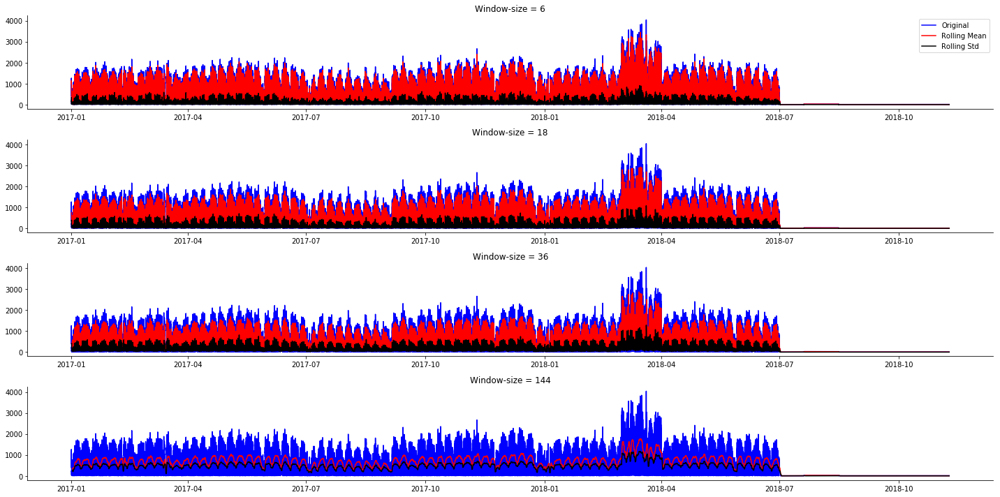

In [ ]:
fig, ax = plt.subplots(4, 1, figsize=(20,10))

# 1 hour, 3 hours, 6 hours, 24 hours
for i, wsize in enumerate([6, 18, 36, 144]):
  roll_mean = loc237_df.fare_amount.rolling(window=wsize).mean()
  roll_std = loc237_df.fare_amount.rolling(window=wsize).std()
  ax[i].plot(loc237_df.fare_amount, color='blue', label="Original")
  ax[i].plot(roll_mean, color='red', label="Rolling Mean")
  ax[i].plot(roll_std, color='black', label="Rolling Std")
  ax[i].set_title(f"Window-size = {wsize}")
ax[0].legend(loc="best")
sns.despine()
# it adjusts the spacing
fig.tight_layout()
plt.show(block=False)

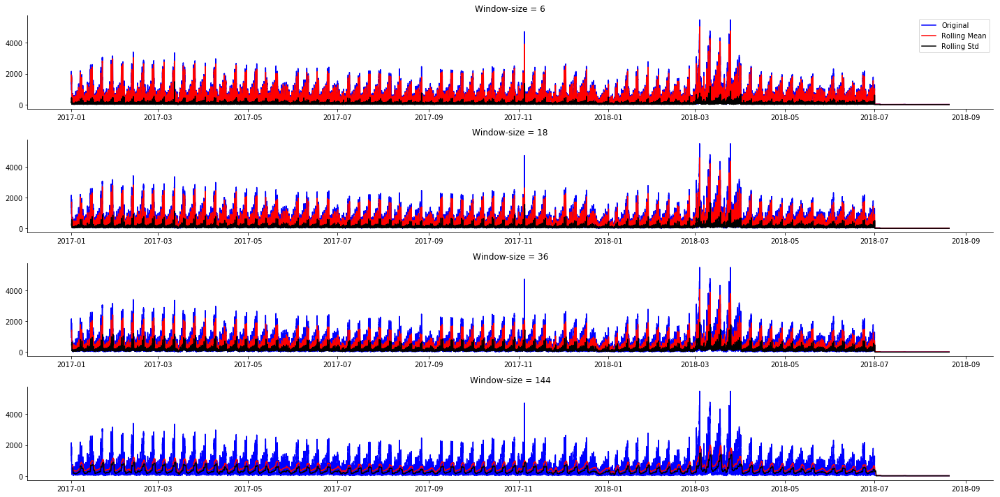

In [ ]:
fig, ax = plt.subplots(4, 1, figsize=(20,10))

# 1 hour, 3 hours, 6 hours, 24 hours
for i, wsize in enumerate([6, 18, 36, 144]):
  roll_mean = loc79_df.fare_amount.rolling(window=wsize).mean()
  roll_std = loc79_df.fare_amount.rolling(window=wsize).std()
  ax[i].plot(loc79_df.fare_amount, color='blue', label="Original")
  ax[i].plot(roll_mean, color='red', label="Rolling Mean")
  ax[i].plot(roll_std, color='black', label="Rolling Std")
  ax[i].set_title(f"Window-size = {wsize}")
ax[0].legend(loc="best")
sns.despine()
# it adjusts the spacing
fig.tight_layout()
plt.show(block=False)

In [ ]:
# daily plot with rolling statitics # 2017
def plot_daily_rolling_statistics(the_series, month, plot_mean=True, window_size=6):
    configure_plotly_browser_state()
    if(month == 2):
      num_of_days = 28
    else:
      num_of_days = 30
      
    s  = pd.date_range(f'2017-{month}-01', f'2017-{month}-{num_of_days}', freq='D').to_series()
    fig = tools.make_subplots(rows=6, cols=5, subplot_titles=s.dt.day_name().values)
    roll_mean = the_series.rolling(window=window_size).mean()
    roll_std = the_series.rolling(window=window_size).std()
    row = 1
    col = 1
    for i in range(1, num_of_days + 1):
      daily_data = the_series.loc[f"2017-{month}-{i}"]
      daily_r_mean = roll_mean.loc[f"2017-{month}-{i}"]
      daily_r_std = roll_std.loc[f"2017-{month}-{i}"]
      #o_trace = go.Scatter(x=daily_data.index, y=daily_data.fare_amount, mode="lines")
      r_mean_trace = go.Scatter(x=daily_r_mean.index, y=daily_r_mean.values, mode="lines")
      r_std_trace = go.Scatter(x=daily_r_std.index, y=daily_r_std.values, mode="lines")
      # plot either the mean or std on every grid of the subplot
      if(plot_mean == True):
        fig.append_trace(r_mean_trace, row, col)
      else:
        fig.append_trace(r_std_trace, row, col)
        
      if(col == 5):
        row += 1
        col = 1
      else:
        col +=1
    

    fig['layout'].update(xaxis=dict(
        titlefont=dict(
            family='Arial, sans-serif',
            size=3),
        showticklabels=False))
    #fig['layout']['xaxis30'].update(title='xaxis 1sdafsdsdafsdfasdfasdfsd title')
    fig['layout'].update(height=1024, width=1024, title='', showlegend=False)
    config={'scrollZoom':False,'displayModeBar':False, "showLink":False, 'showTips':False, "staticPlot":True}

    pyo.iplot(fig, filename='make-subplots-multiple-with-titles', config=config)


The rolling statistics plot shows that the mean and standard deviations get high in the morning and seem stable unitl midnight

In [ ]:
# loc237
# daily rolling mean
plot_daily_rolling_statistics(loc237_df.fare_amount, 5, plot_mean=True, window_size=6)
# daily rolling std
plot_daily_rolling_statistics(loc237_df.fare_amount, 5, plot_mean=False, window_size=6)

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]    [ (1,4) x4,y4 ]    [ (1,5) x5,y5 ]  
[ (2,1) x6,y6 ]    [ (2,2) x7,y7 ]    [ (2,3) x8,y8 ]    [ (2,4) x9,y9 ]    [ (2,5) x10,y10 ]
[ (3,1) x11,y11 ]  [ (3,2) x12,y12 ]  [ (3,3) x13,y13 ]  [ (3,4) x14,y14 ]  [ (3,5) x15,y15 ]
[ (4,1) x16,y16 ]  [ (4,2) x17,y17 ]  [ (4,3) x18,y18 ]  [ (4,4) x19,y19 ]  [ (4,5) x20,y20 ]
[ (5,1) x21,y21 ]  [ (5,2) x22,y22 ]  [ (5,3) x23,y23 ]  [ (5,4) x24,y24 ]  [ (5,5) x25,y25 ]
[ (6,1) x26,y26 ]  [ (6,2) x27,y27 ]  [ (6,3) x28,y28 ]  [ (6,4) x29,y29 ]  [ (6,5) x30,y30 ]



This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]    [ (1,4) x4,y4 ]    [ (1,5) x5,y5 ]  
[ (2,1) x6,y6 ]    [ (2,2) x7,y7 ]    [ (2,3) x8,y8 ]    [ (2,4) x9,y9 ]    [ (2,5) x10,y10 ]
[ (3,1) x11,y11 ]  [ (3,2) x12,y12 ]  [ (3,3) x13,y13 ]  [ (3,4) x14,y14 ]  [ (3,5) x15,y15 ]
[ (4,1) x16,y16 ]  [ (4,2) x17,y17 ]  [ (4,3) x18,y18 ]  [ (4,4) x19,y19 ]  [ (4,5) x20,y20 ]
[ (5,1) x21,y21 ]  [ (5,2) x22,y22 ]  [ (5,3) x23,y23 ]  [ (5,4) x24,y24 ]  [ (5,5) x25,y25 ]
[ (6,1) x26,y26 ]  [ (6,2) x27,y27 ]  [ (6,3) x28,y28 ]  [ (6,4) x29,y29 ]  [ (6,5) x30,y30 ]



In [ ]:
# loc79
# daily rolling mean
plot_daily_rolling_statistics(loc79_df.fare_amount, 5, plot_mean=True, window_size=6)
# daily rolling std
plot_daily_rolling_statistics(loc79_df.fare_amount, 5, plot_mean=False, window_size=6)

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]    [ (1,4) x4,y4 ]    [ (1,5) x5,y5 ]  
[ (2,1) x6,y6 ]    [ (2,2) x7,y7 ]    [ (2,3) x8,y8 ]    [ (2,4) x9,y9 ]    [ (2,5) x10,y10 ]
[ (3,1) x11,y11 ]  [ (3,2) x12,y12 ]  [ (3,3) x13,y13 ]  [ (3,4) x14,y14 ]  [ (3,5) x15,y15 ]
[ (4,1) x16,y16 ]  [ (4,2) x17,y17 ]  [ (4,3) x18,y18 ]  [ (4,4) x19,y19 ]  [ (4,5) x20,y20 ]
[ (5,1) x21,y21 ]  [ (5,2) x22,y22 ]  [ (5,3) x23,y23 ]  [ (5,4) x24,y24 ]  [ (5,5) x25,y25 ]
[ (6,1) x26,y26 ]  [ (6,2) x27,y27 ]  [ (6,3) x28,y28 ]  [ (6,4) x29,y29 ]  [ (6,5) x30,y30 ]



This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]    [ (1,4) x4,y4 ]    [ (1,5) x5,y5 ]  
[ (2,1) x6,y6 ]    [ (2,2) x7,y7 ]    [ (2,3) x8,y8 ]    [ (2,4) x9,y9 ]    [ (2,5) x10,y10 ]
[ (3,1) x11,y11 ]  [ (3,2) x12,y12 ]  [ (3,3) x13,y13 ]  [ (3,4) x14,y14 ]  [ (3,5) x15,y15 ]
[ (4,1) x16,y16 ]  [ (4,2) x17,y17 ]  [ (4,3) x18,y18 ]  [ (4,4) x19,y19 ]  [ (4,5) x20,y20 ]
[ (5,1) x21,y21 ]  [ (5,2) x22,y22 ]  [ (5,3) x23,y23 ]  [ (5,4) x24,y24 ]  [ (5,5) x25,y25 ]
[ (6,1) x26,y26 ]  [ (6,2) x27,y27 ]  [ (6,3) x28,y28 ]  [ (6,4) x29,y29 ]  [ (6,5) x30,y30 ]



In [ ]:
# loc143
# daily rolling mean
plot_daily_rolling_statistics(loc143_df.fare_amount, 5, plot_mean=True, window_size=6)
# daily rolling std
plot_daily_rolling_statistics(loc143_df.fare_amount, 5, plot_mean=False, window_size=6)

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]    [ (1,4) x4,y4 ]    [ (1,5) x5,y5 ]  
[ (2,1) x6,y6 ]    [ (2,2) x7,y7 ]    [ (2,3) x8,y8 ]    [ (2,4) x9,y9 ]    [ (2,5) x10,y10 ]
[ (3,1) x11,y11 ]  [ (3,2) x12,y12 ]  [ (3,3) x13,y13 ]  [ (3,4) x14,y14 ]  [ (3,5) x15,y15 ]
[ (4,1) x16,y16 ]  [ (4,2) x17,y17 ]  [ (4,3) x18,y18 ]  [ (4,4) x19,y19 ]  [ (4,5) x20,y20 ]
[ (5,1) x21,y21 ]  [ (5,2) x22,y22 ]  [ (5,3) x23,y23 ]  [ (5,4) x24,y24 ]  [ (5,5) x25,y25 ]
[ (6,1) x26,y26 ]  [ (6,2) x27,y27 ]  [ (6,3) x28,y28 ]  [ (6,4) x29,y29 ]  [ (6,5) x30,y30 ]



This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]    [ (1,4) x4,y4 ]    [ (1,5) x5,y5 ]  
[ (2,1) x6,y6 ]    [ (2,2) x7,y7 ]    [ (2,3) x8,y8 ]    [ (2,4) x9,y9 ]    [ (2,5) x10,y10 ]
[ (3,1) x11,y11 ]  [ (3,2) x12,y12 ]  [ (3,3) x13,y13 ]  [ (3,4) x14,y14 ]  [ (3,5) x15,y15 ]
[ (4,1) x16,y16 ]  [ (4,2) x17,y17 ]  [ (4,3) x18,y18 ]  [ (4,4) x19,y19 ]  [ (4,5) x20,y20 ]
[ (5,1) x21,y21 ]  [ (5,2) x22,y22 ]  [ (5,3) x23,y23 ]  [ (5,4) x24,y24 ]  [ (5,5) x25,y25 ]
[ (6,1) x26,y26 ]  [ (6,2) x27,y27 ]  [ (6,3) x28,y28 ]  [ (6,4) x29,y29 ]  [ (6,5) x30,y30 ]



In [ ]:
# loc100
# daily rolling mean
plot_daily_rolling_statistics(loc100_df.fare_amount, 5, plot_mean=True, window_size=6)
# daily rolling std
plot_daily_rolling_statistics(loc100_df.fare_amount, 5, plot_mean=False, window_size=6)

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]    [ (1,4) x4,y4 ]    [ (1,5) x5,y5 ]  
[ (2,1) x6,y6 ]    [ (2,2) x7,y7 ]    [ (2,3) x8,y8 ]    [ (2,4) x9,y9 ]    [ (2,5) x10,y10 ]
[ (3,1) x11,y11 ]  [ (3,2) x12,y12 ]  [ (3,3) x13,y13 ]  [ (3,4) x14,y14 ]  [ (3,5) x15,y15 ]
[ (4,1) x16,y16 ]  [ (4,2) x17,y17 ]  [ (4,3) x18,y18 ]  [ (4,4) x19,y19 ]  [ (4,5) x20,y20 ]
[ (5,1) x21,y21 ]  [ (5,2) x22,y22 ]  [ (5,3) x23,y23 ]  [ (5,4) x24,y24 ]  [ (5,5) x25,y25 ]
[ (6,1) x26,y26 ]  [ (6,2) x27,y27 ]  [ (6,3) x28,y28 ]  [ (6,4) x29,y29 ]  [ (6,5) x30,y30 ]



This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]    [ (1,3) x3,y3 ]    [ (1,4) x4,y4 ]    [ (1,5) x5,y5 ]  
[ (2,1) x6,y6 ]    [ (2,2) x7,y7 ]    [ (2,3) x8,y8 ]    [ (2,4) x9,y9 ]    [ (2,5) x10,y10 ]
[ (3,1) x11,y11 ]  [ (3,2) x12,y12 ]  [ (3,3) x13,y13 ]  [ (3,4) x14,y14 ]  [ (3,5) x15,y15 ]
[ (4,1) x16,y16 ]  [ (4,2) x17,y17 ]  [ (4,3) x18,y18 ]  [ (4,4) x19,y19 ]  [ (4,5) x20,y20 ]
[ (5,1) x21,y21 ]  [ (5,2) x22,y22 ]  [ (5,3) x23,y23 ]  [ (5,4) x24,y24 ]  [ (5,5) x25,y25 ]
[ (6,1) x26,y26 ]  [ (6,2) x27,y27 ]  [ (6,3) x28,y28 ]  [ (6,4) x29,y29 ]  [ (6,5) x30,y30 ]



### Tests of Stationarity: Augmented Dickey–Fuller test

ADF tests the null hypothesis that a unit root is present in time series sample. ADF statistic is a negative number and more negative it is the stronger the rejection of the hypothesis that there is a unit root.

* Null Hypotehsis (H0): If accepted, it suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.
* Alternate Hypothesis (H1): The null hypothesis is rejected; it suggests the time series does not have a unit root, meaning it is stationary.
 * p-value > 0.05: Accept H0, the data has a unit root and is non-stationary
 * p-value ≤ 0.05: Reject H0. the data does not have a unit root and is stationary

In [ ]:
# the whole 237
dftest = adfuller(loc237_df.fare_amount, autolag="AIC")
dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
for key, value in dftest[4].items():
  dfoutput[f"Critical value {key}"] = value
print(dfoutput)

Test Statistic                   -28.128789
p value                            0.000000
Flags used                        68.000000
Number of Observations Used    97421.000000
Critical value 1%                 -3.430417
Critical value 5%                 -2.861570
Critical value 10%                -2.566786
dtype: float64


In [ ]:
# the whole 79
dftest = adfuller(loc79_df.fare_amount, autolag="AIC")
dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
for key, value in dftest[4].items():
  dfoutput[f"Critical value {key}"] = value
print(dfoutput)

Test Statistic                   -23.912340
p value                            0.000000
Flags used                        61.000000
Number of Observations Used    85868.000000
Critical value 1%                 -3.430426
Critical value 5%                 -2.861574
Critical value 10%                -2.566788
dtype: float64


In [ ]:
# the whole 143
dftest = adfuller(loc143_df.fare_amount, autolag="AIC")
dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
for key, value in dftest[4].items():
  dfoutput[f"Critical value {key}"] = value
print(dfoutput)

Test Statistic                   -38.411830
p value                            0.000000
Flags used                        65.000000
Number of Observations Used    82317.000000
Critical value 1%                 -3.430429
Critical value 5%                 -2.861575
Critical value 10%                -2.566789
dtype: float64


In [ ]:
# the whole 100
dftest = adfuller(loc100_df.fare_amount, autolag="AIC")
dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
for key, value in dftest[4].items():
  dfoutput[f"Critical value {key}"] = value
print(dfoutput)

Test Statistic                   -18.983430
p value                            0.000000
Flags used                        66.000000
Number of Observations Used    90710.000000
Critical value 1%                 -3.430422
Critical value 5%                 -2.861572
Critical value 10%                -2.566787
dtype: float64


The more negative this statistic, the more likely we are to reject the null hypothesis (we have a stationary dataset). Perhaps it would be worth performing a stationary test at different time scales. Because I am interested in forecasts within 10 minutes interval.

In [ ]:
# daily adcf
def perform_dicky_fuller_test(the_series):
  # Test every day
  from statsmodels.tsa.stattools import adfuller
  num_of_days = [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
  # count how many times null hypothesis is rejected
  count_of_reject = 0
  total_count = 0
  which_months = {i:0 for i in range(1,13)}
  for month in range(1, 13):
    for day in range(1, num_of_days[month - 1] + 1):
      the_day = the_series.loc[f"2017-{month}-{day}"]
      dftest = adfuller(the_day, autolag="AIC")
      dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
      total_count += 1
      if(dfoutput["p value"] < 0.05):
        which_months[month] += 1
        count_of_reject += 1
  print(count_of_reject)
  print(total_count)
  print(which_months)

In [ ]:
perform_dicky_fuller_test(loc237_df.fare_amount)

2
365
{1: 2, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0}


In [ ]:
perform_dicky_fuller_test(loc79_df.fare_amount)

59
365
{1: 7, 2: 4, 3: 3, 4: 6, 5: 4, 6: 4, 7: 5, 8: 6, 9: 5, 10: 5, 11: 6, 12: 4}


In [ ]:
perform_dicky_fuller_test(loc143_df.fare_amount)

1
365
{1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 1, 9: 0, 10: 0, 11: 0, 12: 0}


In [ ]:
perform_dicky_fuller_test(loc100_df.fare_amount)

2
365
{1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 1, 10: 0, 11: 1, 12: 0}


The data seems to be stationary so I don't have to do log transformation 

### Test of Stationarity: Kwiatkowski-Phillips-Schmidt-Shin Test

Null Hypothesis: The process is trend stationary.

Alternate Hypothesis: The series has a unit root (series is not stationary).

In [ ]:
print ('Results of KPSS Test:')
kpsstest = kpss(loc237_df.fare_amount, regression='c')
kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
for key,value in kpsstest[3].items():
    kpss_output['Critical Value (%s)'%key] = value
print (kpss_output)

Results of KPSS Test:
Test Statistic           22.724934
p-value                   0.010000
Lags Used                68.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning:

p-value is smaller than the indicated p-value



In [ ]:
print ('Results of KPSS Test:')
kpsstest = kpss(loc79_df.fare_amount, regression='c')
kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
for key,value in kpsstest[3].items():
    kpss_output['Critical Value (%s)'%key] = value
print (kpss_output)

Results of KPSS Test:
Test Statistic            7.040046
p-value                   0.010000
Lags Used                65.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning:

p-value is smaller than the indicated p-value



In [ ]:
print ('Results of KPSS Test:')
kpsstest = kpss(loc143_df.fare_amount, regression='c')
kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
for key,value in kpsstest[3].items():
    kpss_output['Critical Value (%s)'%key] = value
print (kpss_output)

Results of KPSS Test:
Test Statistic            1.640942
p-value                   0.010000
Lags Used                65.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning:

p-value is smaller than the indicated p-value



In [ ]:
print ('Results of KPSS Test:')
kpsstest = kpss(loc100_df.fare_amount, regression='c')
kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
for key,value in kpsstest[3].items():
    kpss_output['Critical Value (%s)'%key] = value
print (kpss_output)

Results of KPSS Test:
Test Statistic           20.584865
p-value                   0.010000
Lags Used                66.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning:

p-value is smaller than the indicated p-value



KPSS shows that the data is not stationary while ADF says it is. ADF measures difference stationarity while KPSS measures trend stationarity. ARIMA differencing can remove at least a linear trend therefore I don't have to log transform the series.

In [ ]:
# # log transform
# loc237_log = np.log(loc237_df.fare_amount)
# moving_average = loc237_log.rolling(window=12).mean().fillna(0)
# # differencing
# loc237_transformed= loc237_log - moving_average
# perform_dicky_fuller_test(loc237_transformed)
# #plt.plot(loc237_df.fare_amount)
# # daily rolling mean
# #plot_daily_rolling_statistics(loc237_transformed, 5, plot_mean=True, window_size=6)
# # daily rolling std
# #plot_daily_rolling_statistics(loc237_transformed, 5, plot_mean=False, window_size=6)

# # log transform
# loc79_log = np.log(loc79_df.fare_amount)
# moving_average = loc79_log.rolling(window=1).mean().fillna(0)
# # differencing
# loc79_transformed= loc79_log - moving_average
# perform_dicky_fuller_test(loc79_transformed)

### PACF and ACF plots

* ACF describes the autocorrelation between an observation and another observation at a prior time step that includes direct and indirect dependence information.

* The partial autocorrelation at lag k is the correlation that results after removing the effect of any correlations due to the terms at shorter lags.

In [ ]:
from statsmodels.tsa.stattools import acf, pacf
def plot_acf_pacf(the_series, lags=40):
  lag_acf = acf(the_series, nlags=lags)
  lag_pacf = pacf(the_series, nlags=lags, method='ols')
  plt.subplot(121)
  plt.plot(lag_acf)
  plt.axhline(y=0, linestyle='--', color='gray')
  plt.axhline(y=-1.96/np.sqrt(len(the_series)), linestyle='--', color='gray')
  plt.axhline(y=1.96/np.sqrt(len(the_series)), linestyle='--', color='gray')
  plt.title('Autocorrelation Function')

  plt.subplot(122)
  plt.plot(lag_pacf)
  plt.axhline(y=0, linestyle='--', color='gray')
  plt.axhline(y=-1.96/np.sqrt(len(the_series)), linestyle='--', color='gray')
  plt.axhline(y=1.96/np.sqrt(len(the_series)), linestyle='--', color='gray')
  plt.title('Partial Autocorrelation Function')
  plt.tight_layout()
  
def plot_acf_pacf_2(the_series, lags=40):
  pacf_df = pd.DataFrame(pacf(the_series, nlags=lags))
  acf_df = pd.DataFrame(acf(the_series), nlags=lags)

  fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,10))

  ax1.set_title("ACF")
  acf_df.plot(kind='bar', ax=ax1)

  ax2.set_title("PACF")
  pacf_df.plot(kind='bar', ax=ax2)

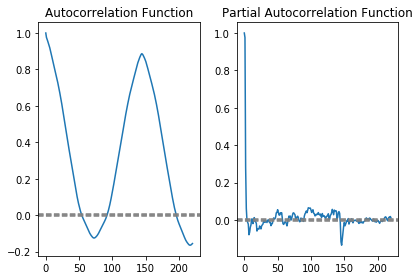

In [ ]:
plot_acf_pacf(loc237_df.fare_amount, lags=220)

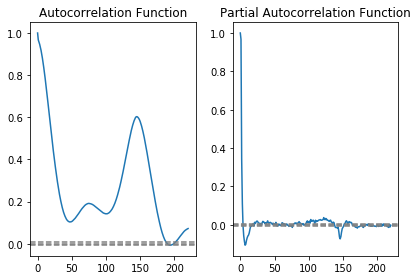

In [ ]:
plot_acf_pacf(loc79_df.fare_amount, lags=220)

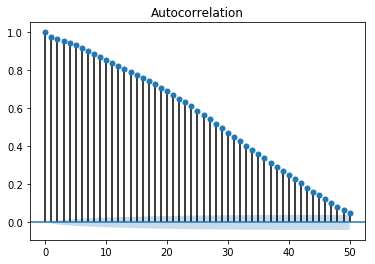

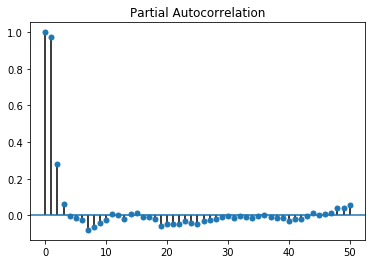

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(loc237_df.fare_amount, lags=50)
plot_pacf(loc237_df.fare_amount, lags=50)
plt.show()

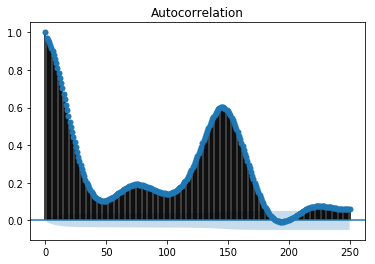

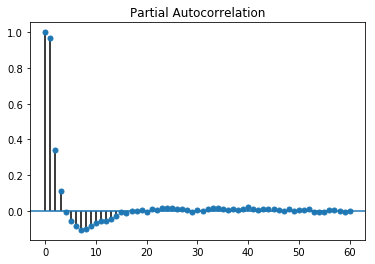

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(loc79_df.fare_amount, lags=250)
plot_pacf(loc79_df.fare_amount, lags=60)
plt.show()

The cone is showing 95% confidence interval. It suggets that correlation values outside of this interval are very likely a correlation and not a statistical fluke. So I look at the lags until the graph enters the confidence interval

Autocorrelation plot shows that the number of lags(q) for MA shall be somewhere between **50 and 60** for location 237 and between **195 and 205** for location 79.  Partial auto correlation for both locations shows that p is between 0 and 5

In [ ]:
# train on 12 months
train_237 = loc237_df["2017"].fare_amount
# forecast the next 6 months
test_237 = loc237_df["2018-01":"2018-06"].fare_amount

In [ ]:
# multistep forecasting preformed really bad!!

# model = ARIMA(train, order=(5,2,55), freq="10min")
# model_results = model.fit(disp=5)
# plt.plot(train, label="Actual")
# plt.plot(model_results.fittedvalues, color='red', label="Predicted") 
# plt.legend(loc="best")
# diff = (model_results.fittedvalues - train).dropna()
# print("RSS: ", sum(diff ** 2))
# print("RMSE: ", np.sqrt(sum(diff ** 2)/len(train)))
# print(model_results.summary())


# model = auto_arima(train, trace=True, stepwise=True, Seasonality=True, max_order=None, stationary=False,
#                    error_action='ignore',
#                    disp=1,n_jobs=-1,
#                    suppress_warnings=True)
# model.fit(train)

# forecast = model.predict(n_periods=len(test))
# forecast = pd.DataFrame(forecast,index = test.index,columns=['Prediction'])

# #plot the predictions for validation set
# plt.plot(train, label='Train')
# plt.plot(test, label='Valid')
# plt.plot(forecast, label='Prediction')
# plt.show()


# predicted_test = pd.Series(model_results.forecast(steps=len(test))[0], index=test.index)
# plt.plot(test, label="Actual")
# plt.plot(predicted_test, color='red', label="Predicted") 
# plt.legend(loc="best")
# diff = (predicted_test - test).dropna()
# print("RSS: ", sum(diff ** 2))
# print("RMSE: ", np.sqrt(sum(diff ** 2)/len(test)))

# # testing arima on loc79
# model = ARIMA(loc79_df.fare_amount, order=(1,1,1), freq="10min")
# results = model.fit(disp=5)
# plt.plot(loc79_df.fare_amount, label="Actual")
# plt.plot(results.fittedvalues, color='red', label="Predicted") 
# plt.legend(loc="best")
# diff = (results.fittedvalues - loc79_df.fare_amount).dropna()
# print("RSS: ", sum(diff ** 2))
# print("RMSE: ", np.sqrt(sum(diff ** 2)/len(loc79_df.fare_amount)))
# print(results.summary())

### Phase 6: LSTM Networks

In [ ]:
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout,BatchNormalization
# faster one
from keras.layers import CuDNNLSTM
# to create custom metrics like RMSE
from keras import backend


Using TensorFlow backend.


In [ ]:
loc237_df = taxi_201718_10min_ff.query("PULocationID == 237").drop("PULocationID", axis=1)
loc79_df = taxi_201718_10min_ff.query("PULocationID == 79").drop("PULocationID", axis=1)
loc143_df = taxi_201718_10min_ff.query("PULocationID == 143").drop("PULocationID", axis=1)
loc100_df = taxi_201718_10min_ff.query("PULocationID == 100").drop("PULocationID", axis=1)

In [ ]:
train_237 = loc237_df["2017"].iloc[:, [0,1,2,4,3]]
test_237 = loc237_df["2018-01":"2018-06"].iloc[:, [0,1,2,4,3]]

train_79 = loc79_df["2017"].iloc[:, [0,1,2,4,3]]   
test_79 = loc79_df["2018-01":"2018-06"].iloc[:, [0,1,2,4,3]]

train_143 = loc143_df["2017"].iloc[:, [0,1,2,4,3]]
test_143 = loc143_df["2018-01":"2018-06"].iloc[:, [0,1,2,4,3]]

train_100 = loc100_df["2017"].iloc[:, [0,1,2,4,3]]
test_100 = loc100_df["2018-01":"2018-06"].iloc[:, [0,1,2,4,3]]

In [ ]:
print(train_237.shape)
train_237.head()

(52560, 5)


,passenger_count,trip_distance,duration,speed,fare_amount
tpep_pickup_datetime,,,,,
2017-01-01 00:00:00,72.0,76.71,7.607222,10.083838,406.0
2017-01-01 00:10:00,168.0,160.20,16.078333,9.963719,854.5
2017-01-01 00:20:00,221.0,242.28,23.158333,10.461893,1235.5
2017-01-01 00:30:00,243.0,236.12,24.818611,9.513828,1262.5
2017-01-01 00:40:00,250.0,252.23,23.053056,10.941283,1249.5


In [ ]:
print(test_237.shape)
test_237.head()

(26064, 5)


,passenger_count,trip_distance,duration,speed,fare_amount
tpep_pickup_datetime,,,,,
2018-01-01 00:00:00,33.0,42.89,2.802222,15.305710,187.0
2018-01-01 00:10:00,163.0,157.21,17.948889,8.758759,883.0
2018-01-01 00:20:00,204.0,190.56,19.655556,9.694969,1026.5
2018-01-01 00:30:00,157.0,185.37,16.892500,10.973509,901.5
2018-01-01 00:40:00,165.0,186.04,16.712778,11.131603,919.0


In [ ]:
print(train_100.shape)
train_100.head()

(52560, 5)


,passenger_count,trip_distance,duration,speed,fare_amount
tpep_pickup_datetime,,,,,
2017-01-01 00:00:00,17.0,22.08,2.803056,7.877118,133.5
2017-01-01 00:10:00,38.0,48.70,5.891389,8.266302,261.5
2017-01-01 00:20:00,17.0,19.30,2.540278,7.597594,115.0
2017-01-01 00:30:00,27.0,24.75,3.469444,7.133707,152.0
2017-01-01 00:40:00,15.0,21.54,3.099722,6.949010,130.5


In [ ]:
print(test_100.shape)
test_100.head()

(26064, 5)


,passenger_count,trip_distance,duration,speed,fare_amount
tpep_pickup_datetime,,,,,
2018-01-01 00:00:00,14.0,24.99,2.546667,9.812827,122.5
2018-01-01 00:10:00,32.0,23.31,3.856389,6.044515,163.5
2018-01-01 00:20:00,6.0,18.37,1.976667,9.293423,93.5
2018-01-01 00:30:00,18.0,19.94,2.629722,7.582550,115.0
2018-01-01 00:40:00,57.0,88.33,10.427778,8.470645,469.5


### A. Vanilla LSTM

* Number of samples: Train: 52k, Test: 26k
* Time-Steps = 12/36/54/144 
* Number of features = 1

It is the simplest LSTM model with just one hidden layer. 

In [ ]:
# earliest to latest
list(range(15, 0, -1))

[15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1]

In [ ]:
# a method to create lagged features and convert them to 3D format.
def convert_to_sequence(train, test, time_steps, normalized):
  scaler = None
  # normalize data
  if (normalized==True):
    scaler = MinMaxScaler(feature_range=(0,1))
    train_df = pd.DataFrame(scaler.fit_transform(train.values.reshape(-1,1)), columns=["fare_amount"])
    test_df = pd.DataFrame(scaler.transform(test.values.reshape(-1,1)), columns=["fare_amount"])
  else:
    train_df = pd.DataFrame(train, columns=["fare_amount"])
    test_df = pd.DataFrame(test, columns=["fare_amount"])
    
  lags = range(time_steps, 0, -1)
  train_df = train_df.assign(**{str(t): train_df.fare_amount.shift(t) for t in lags})
  train_df.dropna(inplace=True)
  test_df = test_df.assign(**{str(t): test_df.fare_amount.shift(t) for t in lags})
  test_df.dropna(inplace=True)

  # lagged features start from column1
  X_train = train_df.iloc[:, 1:].values.reshape(len(train_df), time_steps, 1)
  # fare_amount 
  y_train = train_df.iloc[:, 0].values.reshape(len(train_df), 1)
  X_test = test_df.iloc[:, 1:].values.reshape(len(test_df), time_steps, 1)
  y_test = test_df.iloc[:, 0].values.reshape(len(test_df), 1)
  return X_train, X_test, y_train, y_test, scaler

In [ ]:
# root mean squared error (rmse) for regression (only for Keras tensors)
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

# mean squared error (mse) for regression  (only for Keras tensors)
def mse(y_true, y_pred):
    return backend.mean(backend.square(y_pred - y_true), axis=-1)

In [ ]:
def vanilla_lstm(train, test, lags, memory_cells, epochs, normalized):
  X_train, X_test, y_train, y_test, scaler = convert_to_sequence(train, test, lags, normalized)
  print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
  model = Sequential()
  model.add(CuDNNLSTM(memory_cells, input_shape=(lags, 1)))
  #model.add(Dropout(0.4))
  model.add(Dense(1, activation="linear" ))
  model.compile(loss="mse", optimizer="rmsprop", metrics=[rmse])
  #print(model.summary())
  history = model.fit(X_train, y_train, epochs=epochs, validation_data=(X_test, y_test),batch_size=200, verbose=0)
  return model, history, scaler, X_train, X_test, y_train, y_test

In [ ]:
def diagnostic_plot(history, scaler=None):
  
  # if scaler is given, inverse transform scaled values
  # rmse is in the same unit as fare_amount
  if (scaler != None):
    hloss = scaler.inverse_transform(np.sqrt(history.history["loss"]).reshape(-1,1)).flatten()
    hval_loss = scaler.inverse_transform(np.sqrt(history.history["val_loss"]).reshape(-1,1)).flatten()
    hrmse =  scaler.inverse_transform(np.array(history.history["rmse"]).reshape(-1,1)).flatten()
    hval_rmse =  scaler.inverse_transform(np.array(history.history["val_rmse"]).reshape(-1,1)).flatten()
  else:
    hloss = history.history["loss"]
    hval_loss = history.history["val_loss"]
    hrmse = history.history["rmse"]
    hval_rmse = history.history["val_rmse"]


  # diagnose overfitting, underfitting
  configure_plotly_browser_state()
  # used https://coolors.co
  colors = ['#04E762', '#F5B700', '#00A1E4', '#DC0073']
  trace1 = go.Scatter(y=hloss, mode="lines", name="train", 
                      marker = dict(size = 10,
                                    color = colors[0]
                                    ))
  trace2 = go.Scatter(y=hval_loss, mode="lines", name="validation",
                      marker = dict(size = 10,
                                    color = colors[1]
                                    ))
  # limit legend to show train and validation entries once
  trace3 = go.Scatter(y=hrmse, mode="lines", name="train",
                     marker = dict(size = 10,
                                    color = colors[0]
                                    ),                      
                      showlegend=False)
  trace4 = go.Scatter(y=hval_rmse, mode="lines", name="validation",marker = dict(size = 10,
                                    color = colors[1]
                                    ),                      
                      showlegend=False)


  loss_trace= [trace1, trace2]
  mse_trace = [trace3, trace4]

  fig = tools.make_subplots(rows=1, cols=2, 
                            shared_yaxes=False, shared_xaxes=True, 
                            subplot_titles=('', ''))
  # nice to add plots that have connection
  fig.add_traces(loss_trace, rows=[1,1], cols=[1,1])
  fig.add_traces(mse_trace, rows=[1,1], cols=[2,2])                                                         


  fig['layout']['xaxis1'].update(title='Epoch')
  fig['layout']['xaxis2'].update(title='Epoch')


  fig['layout']['yaxis1'].update(title='Loss')
  # yaxis is shared
  #fig['layout']['yaxis2'].update(title='RMSE')


  fig['layout'].update(height=400, width=600, title='Is the model learning?')
  config={'scrollZoom':False,'displayModeBar':True, "showLink":False, 'showTips':False}
  pyo.iplot(fig, filename='make-subplots-multiple-with-titles', config=config)

In [ ]:
def plot_predictions(model, X_train, y_train, X_test, y_test, limit):
  configure_plotly_browser_state()
#   train_indices = y_train.index.iloc[:limit]
#   test_indices = y_test.index.iloc[:limit]

  y_pred_train = model.predict(X_train).flatten()[:limit]
  y_pred_test = model.predict(X_test).flatten()[:limit]
  y_true_train = y_train.flatten()[:limit]
  y_true_test = y_test.flatten()[:limit]
 
  # https://coolors.co
  colors = ['#04E762', '#F5B700', '#00A1E4', '#DC0073']
  
  trace1 = go.Scatter(y=list(y_pred_train), mode="lines", name="Prediction",
                      marker = dict(size = 15,
                                    color = colors[0]
                                    ))
  trace2 = go.Scatter(y=list(y_true_train), mode="markers", name="Actual",
                      marker = dict(size = 3,
                                    color = colors[1]
                                    ))
  
  trace3 = go.Scatter(y=list(y_pred_test), mode="lines", name="Prediction",
                      marker = dict(size = 15,
                                    color = colors[0]
                                    ),
                     showlegend=False)
  trace4 = go.Scatter(y=list(y_true_test), mode="markers", name="Actual",
                      marker = dict(size = 3,
                                    color = colors[1]
                                    ),
                     showlegend=False)

  train_trace= [trace1, trace2]
  test_trace = [trace3, trace4]

  
  fig = tools.make_subplots(rows=1, cols=2, shared_yaxes=True, shared_xaxes=True, subplot_titles=('Train', 'Validation'))
#   fig.add_trace(trace1, 1,1)
#   fig.add_trace(trace2,1,2)
#   fig.add_trace(trace3,2,1)
#   fig.add_trace(trace4,2,2)

  fig.add_traces(train_trace, rows=[1, 1], cols=[1,1])
  fig.add_traces(test_trace, rows=[1,1], cols=[2,2])                                                         


  fig['layout']['xaxis1'].update(title='Time Step')
  fig['layout']['xaxis2'].update(title='Time Step')


  fig['layout']['yaxis1'].update(title='RMSE')
  # it is shared
  #fig['layout']['yaxis2'].update(title='RMSE')


  fig['layout'].update(height=400, width=600, title='Model Performance')
  config={'scrollZoom':False,'displayModeBar':True, "showLink":False, 'showTips':False}
  pyo.iplot(fig, filename='make-subplots-multiple-with-titles', config=config)

In [ ]:
# 24 steps back
# 60 units
model_one, history_one, _, X_train, X_test, y_train, y_test = vanilla_lstm(train_237.fare_amount, test_237.fare_amount, 24, 60, 100, False)
# print train and validation accuracy
print("{}, {}".format(history_one.history["rmse"][-1], history_one.history['val_rmse'][-1]))

(52536, 24, 1) (52536, 1) (26040, 24, 1) (26040, 1)
90.41663697046542, 147.8938028713525


In [ ]:
diagnostic_plot(history_one)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



In [ ]:
plot_predictions(model_one, X_train, y_train, X_test, y_test, limit=1000)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y1 ]



In [ ]:
# 72 steps back
# 60 units
model_two, history_two, _, X_train, X_test, y_train, y_test = vanilla_lstm(train_237.fare_amount, test_237.fare_amount, 72, 60, 100, False)

In [ ]:
# print train and validation accuracy
print("{}, {}".format(history_two.history["rmse"][-1], history_two.history['val_rmse'][-1]))

102.62558234688204, 171.80584667366665


In [ ]:
diagnostic_plot(history_two)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



In [ ]:
plot_predictions(model_two, X_train, y_train, X_test, y_test, limit=1000)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y1 ]



In [ ]:
# rescaled
model_three, history_three, scaler, X_train, X_test, y_train, y_test = vanilla_lstm(train_237.fare_amount, test_237.fare_amount, 24, 60, 100, True)

(52536, 24, 1) (52536, 1) (26040, 24, 1) (26040, 1)


In [ ]:
# print train and validation accuracy
print("{}, {}".format(history_three.history["rmse"][-1], history_three.history['val_rmse'][-1]))
# inverse transform
# print train and validation accuracy
rmse_t = scaler.inverse_transform(history_three.history["rmse"][-1].reshape(1,1))
vrmse_t = scaler.inverse_transform(history_three.history["val_rmse"][-1].reshape(1,1))

print("{}, {}".format(rmse_t, vrmse_t))

0.030218334914499517, 0.03710274413634326
[[82.94120754]], [[101.26750489]]


In [ ]:
diagnostic_plot(history_three, scaler)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



In [ ]:
plot_predictions(model_three, X_train, y_train, X_test, y_test, limit=1000)
#plot_predictions(history_three)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y1 ]



The LSTM models are flexible. There a  lot of hyperparameters to tune. In general they have good performance on the test-set. Next I tried to train a model to work for all locations. Since it is large data, the training couldn't finish in time

In [ ]:
X_train_all = []
y_train_all = []
X_test_all = []
y_test_all = []
for k in series_by_loc_dict.keys():
  loc_t = series_by_loc_dict[k]
  train_t = series_by_loc_dict[k]["2017"].fare_amount
  test_t = series_by_loc_dict[k]["2018"].fare_amount
  X_train, X_test, y_train, y_test, scaler_all = convert_to_sequence(train_t, test_t, 54, normalized=True)
  X_train_all.append(X_train)
  y_train_all.append(y_train)
  X_test_all.append(X_test)
  y_test_all.append(y_test)
X_train_all = np.concatenate(X_train_all, axis=0)
y_train_all = np.concatenate(y_train_all).ravel()
X_test_all = np.concatenate(X_test_all, axis=0)
y_test_all = np.concatenate(y_test_all).ravel()

In [ ]:
# takes long time
print(X_train_all.shape, y_train_all.shape, X_test_all.shape, y_test_all.shape)
model_four = Sequential()
model_four.add(CuDNNLSTM(40, input_shape=(54, 1)))
model_four.add(Dense(1, activation="linear" ))
model_four.compile(loss="mse", optimizer="rmsprop", metrics=[rmse])
#print(model.summary())
history_four = model_four.fit(X_train_all, y_train_all, epochs=100, validation_data=(X_test_all, y_test_all),batch_size=200, verbose=0)

In [ ]:
# inverse transform
# print train and validation accuracy
rmse_t = scaler_four.inverse_transform(history_four.history["rmse"][-1].reshape(1,1))
vrmse_t = scaler_four.inverse_transform(history_four.history["val_rmse"][-1].reshape(1,1))

print("{}, {}".format(rmse_t, vrmse_t))

In [ ]:
diagnostic_plot(history_three, scaler_four)

(2258530, 36, 1)

### Stacked LSTM

In [ ]:
def convert_to_sequence_multiple(train, test, time_steps):
  the_columns = ["passenger_count", "trip_distance", "duration", "speed", "fare_amount"]
  scaler = MinMaxScaler(feature_range=(0,1))
  train_length = len(train)
  test_length = len(test)
  num_of_features = 5 
  train = pd.DataFrame(scaler.fit_transform(train), columns=the_columns)
  test = pd.DataFrame(scaler.transform(test),  columns=the_columns)
  lags = range(time_steps, 0, -1)
  train_lags = [train[["fare_amount"]]]
  test_lags = [test[["fare_amount"]]]

  for lag in lags:
    curr_lag_df_train = train.shift(lag)
    curr_lag_df_train.columns = [f"{c}_{lag}" for c in the_columns]
    
    curr_lag_df_test = test.shift(lag)
    curr_lag_df_test.columns = [f"{c}_{lag}" for c in the_columns]
    
    train_lags.append(curr_lag_df_train)
    test_lags.append(curr_lag_df_test)

    
  train = pd.concat(train_lags, axis=1).dropna()
  test = pd.concat(test_lags, axis=1).dropna()
  
  # reduce length to reflect dropped null rows
  train_length -= time_steps
  test_length -= time_steps
  
  
  X_train = train.iloc[:, 1:].values.reshape(train_length, time_steps, num_of_features)
  X_test = test.iloc[:, 1:].values.reshape(test_length, time_steps, num_of_features)
  y_train = train.iloc[:, 0]
  y_test = test.iloc[:, 0]
  
  return X_train, X_test,y_train,y_test,scaler

In [ ]:
def stacked_lstm(train, test, lags, num_features, epochs):
  X_train, X_test, y_train, y_test, scaler = convert_to_sequence_multiple(train, test, lags)
  print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
  
  model = Sequential()
  model.add(CuDNNLSTM(40, return_sequences=True, input_shape=(lags, num_features)))
  model.add(CuDNNLSTM(32, return_sequences=True))
  model.add(CuDNNLSTM(32))
  model.add(Dense(1, activation="linear"))
  model.compile(loss="mse", optimizer="rmsprop", metrics=[rmse])
  #model.summary()
  history = model.fit(X_train, y_train, epochs=epochs, validation_data=(X_test, y_test),batch_size=200, verbose=0)
  return model, history, scaler

In [ ]:
def diagnostic_plot_multiple(history, scaler=None):
  hloss = np.zeros((100, 5))
  hloss[:, -1] = history.history["loss"]
  hloss = scaler.inverse_transform(np.sqrt(hloss))[:, -1].flatten()
  
  hval_loss = np.zeros((100, 5))
  hval_loss[:, -1] = history.history["val_loss"]
  hval_loss = scaler.inverse_transform(np.sqrt(hval_loss))[:, -1].flatten()
  
#   hloss = scaler.inverse_transform(np.sqrt(history.history["loss"]).reshape(-1,1)).flatten()
#   hval_loss = scaler.inverse_transform(np.sqrt(history.history["val_loss"]).reshape(-1,1)).flatten()
  
  hrmse = np.zeros((100, 5))
  hrmse[:, -1] = history.history["rmse"]
  hrmse = scaler.inverse_transform(hrmse)[:, -1].flatten()
  
  hval_rmse = np.zeros((100, 5))
  hval_rmse[:, -1] = history.history["val_rmse"]
  hval_rmse = scaler.inverse_transform(hval_rmse)[:, -1].flatten()
  
#   hrmse =  scaler.inverse_transform(np.array(history.history["rmse"]).reshape(-1,1)).flatten()
#   hval_rmse =  scaler.inverse_transform(np.array(history.history["val_rmse"]).reshape(-1,1)).flatten()

  # diagnose overfitting, underfitting
  configure_plotly_browser_state()
  trace1 = go.Scatter(y=hloss, mode="lines", name="train-loss") 
  trace2 = go.Scatter(y=hval_loss, mode="lines", name="val-loss") 
  trace3 = go.Scatter(y=hrmse, mode="lines", name="train-rmse") 
  trace4 = go.Scatter(y=hval_rmse, mode="lines", name="val-rmse") 

  loss_trace= [trace1, trace2]
  mse_trace = [trace3, trace4]

  fig = tools.make_subplots(rows=2, cols=2, subplot_titles=('', ''))
  # nice to add plots that have connection
  fig.add_traces(loss_trace, rows=[1]*len(loss_trace), cols=[1]*len(loss_trace))
  fig.add_traces(mse_trace, rows=[1]*len(mse_trace), cols=[2]*len(mse_trace))                                                         


  fig['layout']['xaxis1'].update(title='Epoch')
  fig['layout']['xaxis2'].update(title='Epoch')


  fig['layout']['yaxis1'].update(title='Loss')
  fig['layout']['yaxis2'].update(title='RMSE')


  fig['layout'].update(height=600, width=800, title='Is the model learning?')
  config={'scrollZoom':False,'displayModeBar':True, "showLink":False, 'showTips':False}
  pyo.iplot(fig, filename='make-subplots-multiple-with-titles', config=config)

In [ ]:
model_five, history_five, scaler_five = stacked_lstm(train_237, test_237, 36, 5, 100)

(52524, 36, 5) (52524,) (26028, 36, 5) (26028,)


In [ ]:
# inverse transform
# print train and validation accuracy

# scaler requires 1 by 5 array. I am interested in the scaler 
# for the last feature(fare_amount)
rmse_t = np.zeros((1,5))
rmse_t[0, -1] = history_five.history["rmse"][-1]
rmse_t = scaler_five.inverse_transform(rmse_t)[0, -1]

vrmse_t = np.zeros((1,5))
vrmse_t[0, -1] = history_five.history["val_rmse"][-1]
vrmse_t = scaler_five.inverse_transform(vrmse_t)[0, -1]

print("{}, {}".format(rmse_t, vrmse_t))

78.09621967509413, 109.97989535110796


In [ ]:
diagnostic_plot_multiple(history_five, scaler_five)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3 ]  [ (2,2) x4,y4 ]



## Conclusion

This project is definitely one of my favorites because it was full of challenges and learned a lot of new things. Yellow taxi  data for 2017 and 2018 contains 1.5 million records, which takes 16 gb memory space. I was advised  to split the data and analyze one chunk at a time but quickly realized that it is going to be painful to aggregate, merge, resample, clean chunks. This is the time when big data techniques came to my mind. There was no time to learn Spark in addition to Deep Learning and Time-Series Analysis. Dask to the rescue. Since it is new python library, except the official documentation, there is no other reference. I experimented with the provided methods and completly relied on stackoverflow and github discussions. I used Google Cloud Platform for the first phases of the project. Tasks like parsing  dates and setting pickup time as index used around 20 gb of RAM and took an hour to complete. These are expensive operations even with Dask.

The dataset is a typical example of real-world datasets where error is prevalent. Dask is pretty fast once a dataframe is indexed by time. I removed extreme outliers like passenger_count = 200, fare_amount=19444, year=2084, trip distance=4e5 miles. I made sure that I am not removing too much. After data cleaning the dataset was reduced just by 3%.

I was surprised to know that 95% of the trips start in Manhattan and among those trips 90% of them end in Manhattan eventhough Manhattan is just one borough of Newyork city with an of area 23 mile squares. It means the 13000 yellow-taxis spend most of their time in this small area. There is a trip at most every 27 seconds.  I restricted the project to trips in Manhattan area.

I resampled the data every 10 minutes on a dask dataframe. This reduced the dataset and starting from this point it was manageble size and could be managed using pandas dataframe. I choose 10 minutes because most trips in Manhattan are less than two miles and a one mile trip takes approximately 10 minutes.

Before trying ARIMA, I had to explore the resampled data. I tested stationarity of the series using ADF test and rolling statistics. According to the test results, the data seemed stationary. The mean fare_amount doesn't seem to depend on time. I saw flutuations in the daily plots and was worried that it may not be stationary at a different time-scale . At some location it is peaking up at 6:00 AM and stays up and goes down after 6:00 PM. At another location, it peaks late and goes down late. I searched for the best p, d, q values and found p=3, d=0, q=5 to yield the lowest AIC.  Forecasting more than one step doesn't seem to be accurate. Thus, I had to perform walk forward validation. It is very expensive operation, only tried 100 steps forward. RSME was $117 which is not bad.

In the last phase of the project I experiemented LSTM models. The cuDNNLSTM is fast on Google Colab's free GPU. I rearranged the data into sequence form. LSTM have a lot of hyper-parameters to tune. I started with one layer neural network then tried stacked LSTM. Sequences with 25 past observations, scaled by MinMaxScaler trained/tested with a single layer LSTM network which has  60 memory cells performed the best: RMSE: $101. There is a big room for improvement. I didn't even utilize duration, trip_distance in order to predict total_fares at a location with less error. It is also possible to add binary variables for the time of the day. I cut the project short because of time-constraints. 

## References


**Blogs**

https://tomaugspurger.github.io/modern-7-timeseries.html

https://www.analyticsvidhya.com/blog/2016/02/time-series-forecasting-codes-python/

https://www.analyticsvidhya.com/blog/2018/09/multivariate-time-series-guide-forecasting-modeling-python-codes/

https://www.analyticsvidhya.com/blog/2018/08/auto-arima-time-series-modeling-python-r/

https://machinelearningmastery.com/make-predictions-time-series-forecasting-python/

https://machinelearningmastery.com/time-series-data-stationary-python/

https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/

https://towardsdatascience.com/3-facts-about-time-series-forecasting-that-surprise-experienced-machine-learning-practitioners-69c18ee89387 (supports jason brownlee)



**Books**

Jason Brownlee LSTM

file:///C:/Users/Tinsae/Downloads/kupdf.net_long-short-term-memory-networks-with-python.pdf

Dr. N.D Lewis Deep Learning for Time-series

https://livebook.manning.com/#!/book/data-science-at-scale-with-python-and-dask



**Videos**

Jeffrey Yau - Time Series Forecasting using Statistical and Machine Learning Models

https://www.youtube.com/watch?v=_vQ0W_qXMxk

Udacity Course - Time Series Forecasting

https://classroom.udacity.com/courses/ud980

Edureka

https://www.youtube.com/watch?v=e8Yw4alG16Q&t=1475s

Time Series Forecasting Theory - Datamites Data Science Projects

https://www.youtube.com/watch?v=YzMV--KhI2I

Cryptocurrency-predicting RNN 

https://www.youtube.com/watch?v=ne-dpRdNReI&t=569s

Time Series Forecasting Using Recurrent Neural Network and Vector Autoregressive Model: When and How

https://www.youtube.com/watch?v=i40Road82No

About Taxis

https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page

https://www.tripsavvy.com/new-york-city-taxis-4026457

Tools Reference

https://towardsdatascience.com/why-every-data-scientist-should-use-dask-81b2b850e15b

https://www.kaggle.com/yuliagm/how-to-work-with-big-datasets-on-16g-ram-dask

conda install -c conda-forge dask 